In [198]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score, classification_report 
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_curve
from sklearn import svm, metrics
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Masking, Embedding
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
from tensorflow.keras.optimizers import SGD
from tensorflow.random import set_seed
from sklearn.metrics import ConfusionMatrixDisplay

set_seed(455)
np.random.seed(455)

In [199]:
df = pd.read_csv('Data_Entry_2017_v2020.csv')

In [200]:
df.describe()

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000
mean,8.573751,14346.381743,46.626365,2646.078844,2486.438842,0.155649,0.155649
std,15.406320,8403.876972,16.602680,341.246429,401.268227,0.016174,0.016174
min,0.000000,1.000000,0.000000,1143.000000,966.000000,0.115000,0.115000
25%,0.000000,7310.750000,34.000000,2500.000000,2048.000000,0.143000,0.143000
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000
max,183.000000,30805.000000,95.000000,3827.000000,4715.000000,0.198800,0.198800


In [201]:
df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,57,M,PA,2682,2749,0.143,0.143
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168
3,00000002_000.png,No Finding,0,2,80,M,PA,2500,2048,0.171,0.171
4,00000003_001.png,Hernia,0,3,74,F,PA,2500,2048,0.168,0.168


In [202]:
'''''''''
This code was executed once, to download all images from the NIHCC Box

## Retrieving images

# Download the 56 zip files in Images_png in batches
import urllib.request

# URLs for the zip files
links = [
    'https://nihcc.box.com/shared/static/vfk49d74nhbxq3nqjg0900w5nvkorp5c.gz',
    'https://nihcc.box.com/shared/static/i28rlmbvmfjbl8p2n3ril0pptcmcu9d1.gz',
    'https://nihcc.box.com/shared/static/f1t00wrtdk94satdfb9olcolqx20z2jp.gz',
	'https://nihcc.box.com/shared/static/0aowwzs5lhjrceb3qp67ahp0rd1l1etg.gz',
    'https://nihcc.box.com/shared/static/v5e3goj22zr6h8tzualxfsqlqaygfbsn.gz',
	'https://nihcc.box.com/shared/static/asi7ikud9jwnkrnkj99jnpfkjdes7l6l.gz',
	'https://nihcc.box.com/shared/static/jn1b4mw4n6lnh74ovmcjb8y48h8xj07n.gz',
    'https://nihcc.box.com/shared/static/tvpxmn7qyrgl0w8wfh9kqfjskv6nmm1j.gz',
	'https://nihcc.box.com/shared/static/upyy3ml7qdumlgk2rfcvlb9k6gvqq2pj.gz',
	'https://nihcc.box.com/shared/static/l6nilvfa9cg3s28tqv1qc1olm3gnz54p.gz',
	'https://nihcc.box.com/shared/static/hhq8fkdgvcari67vfhs7ppg2w6ni4jze.gz',
	'https://nihcc.box.com/shared/static/ioqwiy20ihqwyr8pf4c24eazhh281pbu.gz'
]

for idx, link in enumerate(links):
    fn = 'images_%02d.tar.gz' % (idx+1)
    print('downloading '+fn+'...')
    urllib.request.urlretrieve(link, fn)  # download the zip file

print("Download complete. Please check the checksums")
'''''''''

'\nThis code was executed once, to download all images from the NIHCC Box\n\n## Retrieving images\n\n# Download the 56 zip files in Images_png in batches\nimport urllib.request\n\n# URLs for the zip files\nlinks = [\n    \'https://nihcc.box.com/shared/static/vfk49d74nhbxq3nqjg0900w5nvkorp5c.gz\',\n    \'https://nihcc.box.com/shared/static/i28rlmbvmfjbl8p2n3ril0pptcmcu9d1.gz\',\n    \'https://nihcc.box.com/shared/static/f1t00wrtdk94satdfb9olcolqx20z2jp.gz\',\n\t\'https://nihcc.box.com/shared/static/0aowwzs5lhjrceb3qp67ahp0rd1l1etg.gz\',\n    \'https://nihcc.box.com/shared/static/v5e3goj22zr6h8tzualxfsqlqaygfbsn.gz\',\n\t\'https://nihcc.box.com/shared/static/asi7ikud9jwnkrnkj99jnpfkjdes7l6l.gz\',\n\t\'https://nihcc.box.com/shared/static/jn1b4mw4n6lnh74ovmcjb8y48h8xj07n.gz\',\n    \'https://nihcc.box.com/shared/static/tvpxmn7qyrgl0w8wfh9kqfjskv6nmm1j.gz\',\n\t\'https://nihcc.box.com/shared/static/upyy3ml7qdumlgk2rfcvlb9k6gvqq2pj.gz\',\n\t\'https://nihcc.box.com/shared/static/l6nilvfa9cg3s

In [203]:
from tensorflow.keras import utils

In [204]:
image = tf.keras.utils.load_img('images/00000001_000.png',
    color_mode='grayscale',
    target_size=None,
    #image_size=(256,256),
    interpolation='nearest',
    keep_aspect_ratio=False)

In [205]:
input_arr = tf.keras.utils.img_to_array(image)
input_arr = np.array([input_arr])  # Convert single image to a batch

In [206]:
input_arr

array([[[[202.],
         [199.],
         [195.],
         ...,
         [  5.],
         [  2.],
         [  0.]],

        [[199.],
         [196.],
         [195.],
         ...,
         [  5.],
         [  2.],
         [  0.]],

        [[196.],
         [194.],
         [193.],
         ...,
         [  5.],
         [  2.],
         [  0.]],

        ...,

        [[255.],
         [255.],
         [255.],
         ...,
         [  0.],
         [  0.],
         [  0.]],

        [[255.],
         [255.],
         [254.],
         ...,
         [  0.],
         [  0.],
         [  0.]],

        [[255.],
         [255.],
         [255.],
         ...,
         [  0.],
         [  0.],
         [  0.]]]], dtype=float32)

In [207]:
images1 = tf.keras.utils.image_dataset_from_directory(
    '/Users/Max1/Desktop/MSDS-458 A2/images',
    labels=None,
    label_mode = None,
    class_names=None,
    color_mode='rgb',
    batch_size=1,
    image_size=(227, 227),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False)

Found 4999 files belonging to 1 classes.


In [208]:
images1

<BatchDataset element_spec=TensorSpec(shape=(None, 227, 227, 3), dtype=tf.float32, name=None)>

In [209]:
for i in range(2,13):
    images2 = tf.keras.utils.image_dataset_from_directory(
        ('/Users/Max1/Desktop/MSDS-458 A2/images ' + str(i)),
        labels=None,
        label_mode = None,
        class_names=None,
        color_mode='rgb',
        batch_size=1,
        image_size=(227, 227),
        shuffle=True,
        seed=None,
        validation_split=None,
        subset=None,
        interpolation='bilinear',
        follow_links=False,
        crop_to_aspect_ratio=False)

Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 10000 files belonging to 1 classes.
Found 7121 files belonging to 1 classes.


In [210]:
for x in images1:
  print("image: {}".format(x))

image: [[[[147.04314  147.04314  147.04314 ]
   [139.77571  139.77571  139.77571 ]
   [112.37751  112.37751  112.37751 ]
   ...
   [147.24449  147.24449  147.24449 ]
   [148.06517  148.06517  148.06517 ]
   [147.81528  147.81528  147.81528 ]]

  [[139.69034  139.69034  139.69034 ]
   [120.05838  120.05838  120.05838 ]
   [ 94.82325   94.82325   94.82325 ]
   ...
   [146.32626  146.32626  146.32626 ]
   [146.26654  146.26654  146.26654 ]
   [147.41797  147.41797  147.41797 ]]

  [[138.613    138.613    138.613   ]
   [120.607574 120.607574 120.607574]
   [ 95.235825  95.235825  95.235825]
   ...
   [147.72806  147.72806  147.72806 ]
   [145.63696  145.63696  145.63696 ]
   [146.64185  146.64185  146.64185 ]]

  ...

  [[ 68.044106  68.044106  68.044106]
   [ 74.26652   74.26652   74.26652 ]
   [ 78.172935  78.172935  78.172935]
   ...
   [137.61777  137.61777  137.61777 ]
   [137.83687  137.83687  137.83687 ]
   [138.9236   138.9236   138.9236  ]]

  [[ 68.576164  68.576164  68.576164]


image: [[[[ 27.918198  27.918198  27.918198]
   [ 26.423824  26.423824  26.423824]
   [ 25.298885  25.298885  25.298885]
   ...
   [ 81.001595  81.001595  81.001595]
   [ 66.22344   66.22344   66.22344 ]
   [ 62.4071    62.4071    62.4071  ]]

  [[ 26.17933   26.17933   26.17933 ]
   [ 25.73348   25.73348   25.73348 ]
   [ 25.        25.        25.      ]
   ...
   [115.960815 115.960815 115.960815]
   [ 90.33827   90.33827   90.33827 ]
   [ 68.97885   68.97885   68.97885 ]]

  [[ 25.244493  25.244493  25.244493]
   [ 24.163176  24.163176  24.163176]
   [ 23.049492  23.049492  23.049492]
   ...
   [135.8766   135.8766   135.8766  ]
   [123.522514 123.522514 123.522514]
   [ 86.55173   86.55173   86.55173 ]]

  ...

  [[ 23.054379  23.054379  23.054379]
   [ 22.429655  22.429655  22.429655]
   [ 23.        23.        23.      ]
   ...
   [ 22.395357  22.395357  22.395357]
   [ 23.        23.        23.      ]
   [ 22.466858  22.466858  22.466858]]

  [[ 23.244493  23.244493  23.244493]


image: [[[[  9.059777   9.059777   9.059777]
   [  9.         9.         9.      ]
   [  9.168076   9.168076   9.168076]
   ...
   [105.86432  105.86432  105.86432 ]
   [102.06422  102.06422  102.06422 ]
   [ 95.080864  95.080864  95.080864]]

  [[  9.         9.         9.      ]
   [  9.         9.         9.      ]
   [  9.         9.         9.      ]
   ...
   [ 79.93392   79.93392   79.93392 ]
   [ 78.39594   78.39594   78.39594 ]
   [ 73.93392   73.93392   73.93392 ]]

  [[  9.         9.         9.      ]
   [  9.         9.         9.      ]
   [  9.         9.         9.      ]
   ...
   [ 65.66734   65.66734   65.66734 ]
   [ 66.51895   66.51895   66.51895 ]
   [ 62.97802   62.97802   62.97802 ]]

  ...

  [[  8.         8.         8.      ]
   [  8.         8.         8.      ]
   [  8.         8.         8.      ]
   ...
   [ 62.15982   62.15982   62.15982 ]
   [ 52.79962   52.79962   52.79962 ]
   [ 44.39743   44.39743   44.39743 ]]

  [[  8.         8.         8.      ]


image: [[[[111.3801   111.3801   111.3801  ]
   [ 35.11417   35.11417   35.11417 ]
   [ 33.1901    33.1901    33.1901  ]
   ...
   [ 29.222412  29.222412  29.222412]
   [ 36.955887  36.955887  36.955887]
   [ 49.91802   49.91802   49.91802 ]]

  [[ 36.17933   36.17933   36.17933 ]
   [ 34.        34.        34.      ]
   [ 33.        33.        33.      ]
   ...
   [ 27.429655  27.429655  27.429655]
   [ 35.47186   35.47186   35.47186 ]
   [ 50.553112  50.553112  50.553112]]

  [[ 34.200443  34.200443  34.200443]
   [ 34.05929   34.05929   34.05929 ]
   [ 32.        32.        32.      ]
   ...
   [ 27.395401  27.395401  27.395401]
   [ 33.689384  33.689384  33.689384]
   [ 47.14587   47.14587   47.14587 ]]

  ...

  [[169.68932  169.68932  169.68932 ]
   [170.79276  170.79276  170.79276 ]
   [173.12346  173.12346  173.12346 ]
   ...
   [220.27188  220.27188  220.27188 ]
   [224.       224.       224.      ]
   [226.94563  226.94563  226.94563 ]]

  [[173.46692  173.46692  173.46692 ]


image: [[[[ 13.         13.         13.       ]
   [ 12.         12.         12.       ]
   [ 12.533039   12.533039   12.533039 ]
   ...
   [  6.          6.          6.       ]
   [  6.179326    6.179326    6.179326 ]
   [  6.429174    6.429174    6.429174 ]]

  [[ 13.2444935  13.2444935  13.2444935]
   [ 14.533039   14.533039   14.533039 ]
   [ 13.059292   13.059292   13.059292 ]
   ...
   [  6.2072425   6.2072425   6.2072425]
   [  6.1954813   6.1954813   6.1954813]
   [  7.          7.          7.       ]]

  [[ 11.190102   11.190102   11.190102 ]
   [ 12.059292   12.059292   12.059292 ]
   [ 10.049492   10.049492   10.049492 ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  7.          7.          7.       ]]

  ...

  [[250.29893   250.29893   250.29893  ]
   [247.83687   247.83687   247.83687  ]
   [247.77759   247.77759   247.77759  ]
   ...
   [245.95053   245.95053   245.95053  ]
   [244.77759   244.77759   244.77759  ]
   [246.6

2023-03-12 17:22:45.681711: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: profile 'ICC Profile': 'GRAY': Gray color space not permitted on RGB PNG


image: [[[[  9.57079    9.57079    9.57079 ]
   [  9.         9.         9.      ]
   [  8.831924   8.831924   8.831924]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  8.065163   8.065163   8.065163]
   [  8.         8.         8.      ]
   [  9.14061    9.14061    9.14061 ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  9.         9.         9.      ]
   [  8.         8.         8.      ]
   [  9.         9.         9.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  ...

  [[ 16.054379  16.054379  16.054379]
   [ 15.059278  15.059278  15.059278]
   [ 24.39325   24.39325   24.39325 ]
   ...
   [217.66724  217.66724  217.66724 ]
   [214.78447  214.78447  214.78447 ]
   [201.93353  201.93353  201.93353 ]]

  [[ 18.42382   18.42382   18.42382 ]


image: [[[[ 17.         17.         17.       ]
   [ 16.         16.         16.       ]
   [ 16.         16.         16.       ]
   ...
   [ 11.0543785  11.0543785  11.0543785]
   [ 13.912786   13.912786   13.912786 ]
   [ 20.733337   20.733337   20.733337 ]]

  [[ 16.         16.         16.       ]
   [ 16.         16.         16.       ]
   [ 16.         16.         16.       ]
   ...
   [ 10.792758   10.792758   10.792758 ]
   [ 14.46694    14.46694    14.46694  ]
   [ 20.733337   20.733337   20.733337 ]]

  [[ 15.809898   15.809898   15.809898 ]
   [ 16.         16.         16.       ]
   [ 16.         16.         16.       ]
   ...
   [ 11.222412   11.222412   11.222412 ]
   [ 13.733459   13.733459   13.733459 ]
   [ 20.678957   20.678957   20.678957 ]]

  ...

  [[182.22241   182.22241   182.22241  ]
   [186.55518   186.55518   186.55518  ]
   [189.99994   189.99994   189.99994  ]
   ...
   [211.32135   211.32135   211.32135  ]
   [220.5262    220.5262    220.5262   ]
   [226.6

image: [[[[192.15639   192.15639   192.15639  ]
   [195.08627   195.08627   195.08627  ]
   [199.17842   199.17842   199.17842  ]
   ...
   [ 22.         22.         22.       ]
   [ 20.848614   20.848614   20.848614 ]
   [ 17.918161   17.918161   17.918161 ]]

  [[191.0211    191.0211    191.0211   ]
   [191.65749   191.65749   191.65749  ]
   [200.65895   200.65895   200.65895  ]
   ...
   [ 18.429655   18.429655   18.429655 ]
   [ 22.3959     22.3959     22.3959   ]
   [ 17.022074   17.022074   17.022074 ]]

  [[191.01035   191.01035   191.01035  ]
   [190.68098   190.68098   190.68098  ]
   [200.3326    200.3326    200.3326   ]
   ...
   [ 19.568333   19.568333   19.568333 ]
   [ 17.207245   17.207245   17.207245 ]
   [ 19.847042   19.847042   19.847042 ]]

  ...

  [[ 79.16804    79.16804    79.16804  ]
   [ 96.20693    96.20693    96.20693  ]
   [ 95.29639    95.29639    95.29639  ]
   ...
   [  6.777588    6.777588    6.777588 ]
   [  6.222412    6.222412    6.222412 ]
   [  7. 

image: [[[[  1.           1.           1.        ]
   [  0.73348045   0.73348045   0.73348045]
   [ 96.355484    96.355484    96.355484  ]
   ...
   [ 32.13574     32.13574     32.13574   ]
   [ 34.26654     34.26654     34.26654   ]
   [ 35.429127    35.429127    35.429127  ]]

  [[  1.           1.           1.        ]
   [  0.73348045   0.73348045   0.73348045]
   [ 93.142815    93.142815    93.142815  ]
   ...
   [ 32.777588    32.777588    32.777588  ]
   [ 32.195503    32.195503    32.195503  ]
   [ 32.75541     32.75541     32.75541   ]]

  [[  1.           1.           1.        ]
   [  0.73348045   0.73348045   0.73348045]
   [ 91.77974     91.77974     91.77974   ]
   ...
   [ 48.676754    48.676754    48.676754  ]
   [ 31.852053    31.852053    31.852053  ]
   [ 33.879444    33.879444    33.879444  ]]

  ...

  [[  1.           1.           1.        ]
   [  0.73348045   0.73348045   0.73348045]
   [241.6674     241.6674     241.6674    ]
   ...
   [232.44482    232.44482  

image: [[[[  4.2444935   4.2444935   4.2444935]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  6.1846805   6.1846805   6.1846805]]

  [[  4.          4.          4.       ]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]]

  [[  4.          4.          4.       ]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  6.1900644   6.1900644   6.1900644]]

  ...

  [[118.66724   118.66724   118.66724  ]
   [129.07445   129.07445   129.07445  ]
   [132.54367   132.54367   132.54367  ]
   ...
   [163.44482   163.44482   163.44482  ]
   [161.91862   161.91862   161.91862  ]
   [159.4

image: [[[[ 98.44493   98.44493   98.44493 ]
   [ 54.64538   54.64538   54.64538 ]
   [ 30.721794  30.721794  30.721794]
   ...
   [ 22.        22.        22.      ]
   [ 23.798626  23.798626  23.798626]
   [ 31.119532  31.119532  31.119532]]

  [[ 95.51597   95.51597   95.51597 ]
   [ 54.672356  54.672356  54.672356]
   [ 30.460175  30.460175  30.460175]
   ...
   [ 22.        22.        22.      ]
   [ 23.92896   23.92896   23.92896 ]
   [ 30.        30.        30.      ]]

  [[ 96.575745  96.575745  96.575745]
   [ 53.727234  53.727234  53.727234]
   [ 29.716894  29.716894  29.716894]
   ...
   [ 21.222412  21.222412  21.222412]
   [ 23.        23.        23.      ]
   [ 30.244446  30.244446  30.244446]]

  ...

  [[238.4718   238.4718   238.4718  ]
   [238.38554  238.38554  238.38554 ]
   [236.87654  236.87654  236.87654 ]
   ...
   [213.13869  213.13869  213.13869 ]
   [204.16864  204.16864  204.16864 ]
   [197.31891  197.31891  197.31891 ]]

  [[237.97795  237.97795  237.97795 ]


image: [[[[ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   ...
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]]

  [[ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   ...
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]]

  [[ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   ...
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]]

  ...

  [[ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   ...
   [72.72812  72.72812  72.72812 ]
   [52.495396 52.495396 52.495396]
   [35.95279  35.95279  35.95279 ]]

  [[ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   [ 0.        0.        0.      ]
   ..

image: [[[[ 6.         6.         6.       ]
   [ 6.         6.         6.       ]
   [ 6.         6.         6.       ]
   ...
   [ 6.         6.         6.       ]
   [ 9.532086   9.532086   9.532086 ]
   [26.466675  26.466675  26.466675 ]]

  [[ 6.         6.         6.       ]
   [ 6.         6.         6.       ]
   [ 5.7334805  5.7334805  5.7334805]
   ...
   [ 6.         6.         6.       ]
   [ 9.733459   9.733459   9.733459 ]
   [26.95571   26.95571   26.95571  ]]

  [[ 5.         5.         5.       ]
   [ 5.         5.         5.       ]
   [ 5.         5.         5.       ]
   ...
   [ 6.         6.         6.       ]
   [ 9.466919   9.466919   9.466919 ]
   [27.054142  27.054142  27.054142 ]]

  ...

  [[ 7.         7.         7.       ]
   [ 7.         7.         7.       ]
   [ 7.         7.         7.       ]
   ...
   [ 7.         7.         7.       ]
   [10.689331  10.689331  10.689331 ]
   [22.656937  22.656937  22.656937 ]]

  [[ 7.         7.         7.       ]


image: [[[[152.48898   152.48898   152.48898  ]
   [146.53212   146.53212   146.53212  ]
   [139.74382   139.74382   139.74382  ]
   ...
   [  6.2444935   6.2444935   6.2444935]
   [  6.2444935   6.2444935   6.2444935]
   [  5.6958365   5.6958365   5.6958365]]

  [[142.59729   142.59729   142.59729  ]
   [134.86288   134.86288   134.86288  ]
   [113.98131   113.98131   113.98131  ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  5.5111084   5.5111084   5.5111084]]

  [[132.44493   132.44493   132.44493  ]
   [126.40767   126.40767   126.40767  ]
   [ 96.66961    96.66961    96.66961  ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  5.5111084   5.5111084   5.5111084]]

  ...

  [[155.96611   155.96611   155.96611  ]
   [136.00204   136.00204   136.00204  ]
   [ 68.572685   68.572685   68.572685 ]
   ...
   [  6.          6.          6.       ]
   [  6.1631303   6.1631303   6.1631303]
   [  5.6

image: [[[[123.6611    123.6611    123.6611   ]
   [ 90.67144    90.67144    90.67144  ]
   [ 66.557274   66.557274   66.557274 ]
   ...
   [240.3223    240.3223    240.3223   ]
   [247.00002   247.00002   247.00002  ]
   [252.91806   252.91806   252.91806  ]]

  [[ 47.88804    47.88804    47.88804  ]
   [ 24.535246   24.535246   24.535246 ]
   [ 10.112337   10.112337   10.112337 ]
   ...
   [177.80585   177.80585   177.80585  ]
   [203.52467   203.52467   203.52467  ]
   [239.52255   239.52255   239.52255  ]]

  [[ 10.732134   10.732134   10.732134 ]
   [  1.9118958   1.9118958   1.9118958]
   [  0.          0.          0.       ]
   ...
   [ 67.33894    67.33894    67.33894  ]
   [100.56148   100.56148   100.56148  ]
   [163.38531   163.38531   163.38531  ]]

  ...

  [[  4.          4.          4.       ]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  7.0625935   7.0625935   7.0625935]
   [ 38.5791     38.5791     38.5791   ]
   [105.4

image: [[[[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.          1.          1.       ]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]]

  [[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.          1.          1.       ]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]]

  [[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.          1.          1.       ]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]]

  ...

  [[102.59774   102.59774   102.59774  ]
   [105.28169   105.28169   105.28169  ]
   [109.85151   109.85151   109.85151  ]
   ...
   [  6.222412    6.222412    6.222412 ]
   [  6.059282    6.059282    6.059282 ]
   [  6. 

image: [[[[1.        1.        1.       ]
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   ...
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   [0.7555542 0.7555542 0.7555542]]

  [[1.        1.        1.       ]
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   ...
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   [0.7555542 0.7555542 0.7555542]]

  [[1.        1.        1.       ]
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   ...
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   [0.7555542 0.7555542 0.7555542]]

  ...

  [[1.        1.        1.       ]
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   ...
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   [0.7555542 0.7555542 0.7555542]]

  [[1.        1.        1.       ]
   [1.        1.        1.       ]
   [1.        1.        1.       ]
   ..

image: [[[[  2.42921    2.42921    2.42921 ]
   [  2.         2.         2.      ]
   [  2.         2.         2.      ]
   ...
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  [[  2.         2.         2.      ]
   [  2.         2.         2.      ]
   [  2.         2.         2.      ]
   ...
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  [[  2.         2.         2.      ]
   [  2.         2.         2.      ]
   [  2.         2.         2.      ]
   ...
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  ...

  [[ 12.989895  12.989895  12.989895]
   [ 22.307947  22.307947  22.307947]
   [ 82.208305  82.208305  82.208305]
   ...
   [119.604645 119.604645 119.604645]
   [113.       113.       113.      ]
   [105.390274 105.390274 105.390274]]

  [[  3.         3.         3.      ]


image: [[[[ 44.        44.        44.      ]
   [ 43.        43.        43.      ]
   [ 43.07642   43.07642   43.07642 ]
   ...
   [157.83197  157.83197  157.83197 ]
   [154.37483  154.37483  154.37483 ]
   [145.51111  145.51111  145.51111 ]]

  [[ 41.44585   41.44585   41.44585 ]
   [ 41.        41.        41.      ]
   [ 40.852066  40.852066  40.852066]
   ...
   [153.40768  153.40768  153.40768 ]
   [150.1955   150.1955   150.1955  ]
   [142.82085  142.82085  142.82085 ]]

  [[ 40.412567  40.412567  40.412567]
   [ 40.163177  40.163177  40.163177]
   [ 39.65405   39.65405   39.65405 ]
   ...
   [153.77753  153.77753  153.77753 ]
   [151.46642  151.46642  151.46642 ]
   [145.11371  145.11371  145.11371 ]]

  ...

  [[ 32.94562   32.94562   32.94562 ]
   [ 31.        31.        31.      ]
   [ 30.827066  30.827066  30.827066]
   ...
   [ 57.77588   57.77588   57.77588 ]
   [ 33.4072    33.4072    33.4072  ]
   [ 29.380156  29.380156  29.380156]]

  [[ 32.179325  32.179325  32.179325]


image: [[[[ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   ...
   [ 20.        20.        20.      ]
   [ 22.532085  22.532085  22.532085]
   [ 44.895752  44.895752  44.895752]]

  [[ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   ...
   [ 20.        20.        20.      ]
   [ 22.466919  22.466919  22.466919]
   [ 43.156937  43.156937  43.156937]]

  [[ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   ...
   [ 20.        20.        20.      ]
   [ 21.73346   21.73346   21.73346 ]
   [ 42.955566  42.955566  42.955566]]

  ...

  [[ 21.        21.        21.      ]
   [ 21.        21.        21.      ]
   [ 21.        21.        21.      ]
   ...
   [232.22241  232.22241  232.22241 ]
   [235.0666   235.0666   235.0666  ]
   [240.03493  240.03493  240.03493 ]]

  [[ 21.        21.        21.      ]


image: [[[[ 9.         9.         9.       ]
   [ 9.934837   9.934837   9.934837 ]
   [11.945608  11.945608  11.945608 ]
   ...
   [ 4.         4.         4.       ]
   [ 4.7334595  4.7334595  4.7334595]
   [ 6.0597653  6.0597653  6.0597653]]

  [[14.022026  14.022026  14.022026 ]
   [15.337552  15.337552  15.337552 ]
   [15.533039  15.533039  15.533039 ]
   ...
   [ 4.         4.         4.       ]
   [ 4.7334595  4.7334595  4.7334595]
   [ 5.79863    5.79863    5.79863  ]]

  [[18.609457  18.609457  18.609457 ]
   [19.98476   19.98476   19.98476  ]
   [21.72804   21.72804   21.72804  ]
   ...
   [ 4.         4.         4.       ]
   [ 4.9407034  4.9407034  4.9407034]
   [ 6.         6.         6.       ]]

  ...

  [[ 4.488987   4.488987   4.488987 ]
   [12.125356  12.125356  12.125356 ]
   [24.99989   24.99989   24.99989  ]
   ...
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]
   [ 6.853989   6.853989   6.853989 ]]

  [[ 6.7334805  6.7334805  6.7334805]


image: [[[[207.2656   207.2656   207.2656  ]
   [207.43997  207.43997  207.43997 ]
   [198.70956  198.70956  198.70956 ]
   ...
   [ 13.        13.        13.      ]
   [ 13.        13.        13.      ]
   [ 12.533325  12.533325  12.533325]]

  [[201.75368  201.75368  201.75368 ]
   [199.52534  199.52534  199.52534 ]
   [190.46643  190.46643  190.46643 ]
   ...
   [ 13.        13.        13.      ]
   [ 13.        13.        13.      ]
   [ 12.533325  12.533325  12.533325]]

  [[191.07452  191.07452  191.07452 ]
   [190.48166  190.48166  190.48166 ]
   [182.6674   182.6674   182.6674  ]
   ...
   [ 13.        13.        13.      ]
   [ 13.        13.        13.      ]
   [ 12.533325  12.533325  12.533325]]

  ...

  [[255.       255.       255.      ]
   [254.73347  254.73347  254.73347 ]
   [249.59343  249.59343  249.59343 ]
   ...
   [ 11.222412  11.222412  11.222412]
   [ 12.        12.        12.      ]
   [ 12.533325  12.533325  12.533325]]

  [[255.       255.       255.      ]


image: [[[[135.0211   135.0211   135.0211  ]
   [116.7757   116.7757   116.7757  ]
   [ 96.3348    96.3348    96.3348  ]
   ...
   [132.38023  132.38023  132.38023 ]
   [131.53308  131.53308  131.53308 ]
   [131.69035  131.69035  131.69035 ]]

  [[120.71054  120.71054  120.71054 ]
   [ 96.25882   96.25882   96.25882 ]
   [ 77.64537   77.64537   77.64537 ]
   ...
   [141.10338  141.10338  141.10338 ]
   [138.6575   138.6575   138.6575  ]
   [139.4026   139.4026   139.4026  ]]

  [[114.02203  114.02203  114.02203 ]
   [ 90.20044   90.20044   90.20044 ]
   [ 74.44494   74.44494   74.44494 ]
   ...
   [112.952675 112.952675 112.952675]
   [116.17163  116.17163  116.17163 ]
   [123.80172  123.80172  123.80172 ]]

  ...

  [[ 40.7114    40.7114    40.7114  ]
   [ 37.674206  37.674206  37.674206]
   [ 35.049427  35.049427  35.049427]
   ...
   [ 85.88965   85.88965   85.88965 ]
   [106.15625  106.15625  106.15625 ]
   [127.75043  127.75043  127.75043 ]]

  [[ 44.668293  44.668293  44.668293]


image: [[[[ 3.7555065  3.7555065  3.7555065]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]]

  [[ 3.466961   3.466961   3.466961 ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]]

  [[ 4.434595   4.434595   4.434595 ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]]

  ...

  [[ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [27.84189   27.84189   27.84189  ]
   [30.923235  30.923235  30.923235 ]
   [ 4.755554   4.755554   4.755554 ]]

  [[ 1.         1.         1.       ]


image: [[[[0.        0.        0.       ]
   [0.        0.        0.       ]
   [0.        0.        0.       ]
   ...
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   [4.5111084 4.5111084 4.5111084]]

  [[0.        0.        0.       ]
   [0.        0.        0.       ]
   [0.        0.        0.       ]
   ...
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   [4.5111084 4.5111084 4.5111084]]

  [[0.        0.        0.       ]
   [0.        0.        0.       ]
   [0.        0.        0.       ]
   ...
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   [4.5111084 4.5111084 4.5111084]]

  ...

  [[5.        5.        5.       ]
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   ...
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   [4.5111084 4.5111084 4.5111084]]

  [[5.        5.        5.       ]
   [5.        5.        5.       ]
   [5.        5.        5.       ]
   ..

image: [[[[  6.         6.         6.      ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [169.86774  169.86774  169.86774 ]
   [180.82466  180.82466  180.82466 ]
   [197.60071  197.60071  197.60071 ]]

  [[  6.         6.         6.      ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [127.81044  127.81044  127.81044 ]
   [148.87766  148.87766  148.87766 ]
   [175.3773   175.3773   175.3773  ]]

  [[  6.         6.         6.      ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [ 58.559258  58.559258  58.559258]
   [ 82.678474  82.678474  82.678474]
   [137.05235  137.05235  137.05235 ]]

  ...

  [[ 75.20033   75.20033   75.20033 ]
   [ 92.674034  92.674034  92.674034]
   [106.95041  106.95041  106.95041 ]
   ...
   [206.50742  206.50742  206.50742 ]
   [222.5262   222.5262   222.5262  ]
   [227.9776   227.9776   227.9776  ]]

  [[ 92.33561   92.33561   92.33561 ]


image: [[[[ 4.488987    4.488987    4.488987  ]
   [ 3.          3.          3.        ]
   [ 3.          3.          3.        ]
   ...
   [ 9.755396    9.755396    9.755396  ]
   [22.309555   22.309555   22.309555  ]
   [24.59571    24.59571    24.59571   ]]

  [[ 3.          3.          3.        ]
   [ 3.          3.          3.        ]
   [ 3.          3.          3.        ]
   ...
   [ 0.16313493  0.16313493  0.16313493]
   [ 2.9339008   2.9339008   2.9339008 ]
   [ 1.3097384   1.3097384   1.3097384 ]]

  [[ 3.          3.          3.        ]
   [ 3.          3.          3.        ]
   [ 3.          3.          3.        ]
   ...
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]]

  ...

  [[ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   ...
   [ 6.222412    6.222412    6.222412  ]
   [12.57033    12.57033    12.57033   ]
   [24.15

image: [[[[ 44.260216  44.260216  44.260216]
   [ 25.292583  25.292583  25.292583]
   [  8.74382    8.74382    8.74382 ]
   ...
   [116.01033  116.01033  116.01033 ]
   [115.79869  115.79869  115.79869 ]
   [116.80877  116.80877  116.80877 ]]

  [[ 40.64042   40.64042   40.64042 ]
   [ 23.205397  23.205397  23.205397]
   [  8.444935   8.444935   8.444935]
   ...
   [ 94.074615  94.074615  94.074615]
   [ 92.329865  92.329865  92.329865]
   [ 93.421745  93.421745  93.421745]]

  [[ 36.86919   36.86919   36.86919 ]
   [ 22.711454  22.711454  22.711454]
   [  8.444935   8.444935   8.444935]
   ...
   [ 61.557327  61.557327  61.557327]
   [ 60.171635  60.171635  60.171635]
   [ 59.21425   59.21425   59.21425 ]]

  ...

  [[ 53.123928  53.123928  53.123928]
   [ 51.451794  51.451794  51.451794]
   [ 54.096863  54.096863  54.096863]
   ...
   [ 33.901066  33.901066  33.901066]
   [ 31.984846  31.984846  31.984846]
   [ 31.0764    31.0764    31.0764  ]]

  [[ 49.37483   49.37483   49.37483 ]


image: [[[[236.53212   236.53212   236.53212  ]
   [223.35866   223.35866   223.35866  ]
   [219.40088   219.40088   219.40088  ]
   ...
   [219.26167   219.26167   219.26167  ]
   [227.68446   227.68446   227.68446  ]
   [231.76938   231.76938   231.76938  ]]

  [[222.50919   222.50919   222.50919  ]
   [199.652     199.652     199.652    ]
   [163.07216   163.07216   163.07216  ]
   ...
   [204.2602    204.2602    204.2602   ]
   [210.71587   210.71587   210.71587  ]
   [221.6449    221.6449    221.6449   ]]

  [[188.87851   188.87851   188.87851  ]
   [120.01395   120.01395   120.01395  ]
   [ 70.56168    70.56168    70.56168  ]
   ...
   [187.06274   187.06274   187.06274  ]
   [193.11234   193.11234   193.11234  ]
   [203.835     203.835     203.835    ]]

  ...

  [[ 12.0543785  12.0543785  12.0543785]
   [ 10.         10.         10.       ]
   [  9.          9.          9.       ]
   ...
   [ 11.         11.         11.       ]
   [ 16.99312    16.99312    16.99312  ]
   [ 45.6

image: [[[[ 28.364048  28.364048  28.364048]
   [ 29.043137  29.043137  29.043137]
   [ 28.244493  28.244493  28.244493]
   ...
   [ 21.244493  21.244493  21.244493]
   [ 22.043121  22.043121  22.043121]
   [ 26.488892  26.488892  26.488892]]

  [[ 28.244493  28.244493  28.244493]
   [ 28.195486  28.195486  28.195486]
   [ 28.792772  28.792772  28.792772]
   ...
   [ 20.429655  20.429655  20.429655]
   [ 21.92896   21.92896   21.92896 ]
   [ 25.488892  25.488892  25.488892]]

  [[ 28.190102  28.190102  28.190102]
   [ 28.        28.        28.      ]
   [ 29.        29.        29.      ]
   ...
   [ 20.777533  20.777533  20.777533]
   [ 21.222467  21.222467  21.222467]
   [ 25.733337  25.733337  25.733337]]

  ...

  [[ 52.98819   52.98819   52.98819 ]
   [ 54.178307  54.178307  54.178307]
   [ 52.27184   52.27184   52.27184 ]
   ...
   [210.       210.       210.      ]
   [211.42967  211.42967  211.42967 ]
   [215.08633  215.08633  215.08633 ]]

  [[ 68.99903   68.99903   68.99903 ]


image: [[[[0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   ...
   [4.533039 4.533039 4.533039]
   [4.533039 4.533039 4.533039]
   [4.533039 4.533039 4.533039]]

  [[0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   ...
   [6.       6.       6.      ]
   [6.       6.       6.      ]
   [6.       6.       6.      ]]

  [[0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   ...
   [6.       6.       6.      ]
   [6.       6.       6.      ]
   [6.       6.       6.      ]]

  ...

  [[0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   ...
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]]

  [[0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   ...
   [0.       0.       0.      ]
   [0.       0.       0.      ]
   [0.       0.

image: [[[[  8.326297    8.326297    8.326297 ]
   [ 14.223383   14.223383   14.223383 ]
   [ 17.53304    17.53304    17.53304  ]
   ...
   [ 13.07646    13.07646    13.07646  ]
   [ 12.798627   12.798627   12.798627 ]
   [ 12.2444935  12.2444935  12.2444935]]

  [[ 16.885832   16.885832   16.885832 ]
   [ 19.53304    19.53304    19.53304  ]
   [ 22.103344   22.103344   22.103344 ]
   ...
   [ 12.777588   12.777588   12.777588 ]
   [ 11.195502   11.195502   11.195502 ]
   [ 11.         11.         11.       ]]

  [[ 21.609457   21.609457   21.609457 ]
   [ 24.836824   24.836824   24.836824 ]
   [ 27.72804    27.72804    27.72804  ]
   ...
   [ 12.         12.         12.       ]
   [ 11.         11.         11.       ]
   [ 10.244446   10.244446   10.244446 ]]

  ...

  [[198.01033   198.01033   198.01033  ]
   [197.        197.        197.       ]
   [197.99994   197.99994   197.99994  ]
   ...
   [ 13.172945   13.172945   13.172945 ]
   [ 14.         14.         14.       ]
   [ 13.2

image: [[[[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  1.1680338   1.1680338   1.1680338]
   [  4.668292    4.668292    4.668292 ]
   [ 20.162512   20.162512   20.162512 ]]

  [[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  1.2224121   1.2224121   1.2224121]
   [  5.2714376   5.2714376   5.2714376]
   [ 21.401525   21.401525   21.401525 ]]

  [[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  1.2224121   1.2224121   1.2224121]
   [  4.8966303   4.8966303   4.8966303]
   [ 21.999762   21.999762   21.999762 ]]

  ...

  [[ 22.82346    22.82346    22.82346  ]
   [ 23.556885   23.556885   23.556885 ]
   [ 22.95234    22.95234    22.95234  ]
   ...
   [ 39.0643     39.0643     39.0643   ]
   [ 60.528347   60.528347   60.528347 ]
   [ 85.0

image: [[[[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  ...

  [[ 21.011644  21.011644  21.011644]
   [ 18.421452  18.421452  18.421452]
   [ 24.566513  24.566513  24.566513]
   ...
   [135.54205  135.54205  135.54205 ]
   [161.48207  161.48207  161.48207 ]
   [165.70654  165.70654  165.70654 ]]

  [[ 22.599117  22.599117  22.599117]


image: [[[[246.5101   246.5101   246.5101  ]
   [216.13931  216.13931  216.13931 ]
   [197.91545  197.91545  197.91545 ]
   ...
   [192.03935  192.03935  192.03935 ]
   [206.21378  206.21378  206.21378 ]
   [220.40971  220.40971  220.40971 ]]

  [[181.4732   181.4732   181.4732  ]
   [128.5325   128.5325   128.5325  ]
   [ 94.53691   94.53691   94.53691 ]
   ...
   [ 55.032547  55.032547  55.032547]
   [ 74.798904  74.798904  74.798904]
   [ 96.11999   96.11999   96.11999 ]]

  [[104.3033   104.3033   104.3033  ]
   [ 59.16705   59.16705   59.16705 ]
   [ 35.37315   35.37315   35.37315 ]
   ...
   [ 10.161761  10.161761  10.161761]
   [ 16.231434  16.231434  16.231434]
   [ 30.257076  30.257076  30.257076]]

  ...

  [[ 16.488987  16.488987  16.488987]
   [  9.73348    9.73348    9.73348 ]
   [  8.         8.         8.      ]
   ...
   [  7.         7.         7.      ]
   [  7.         7.         7.      ]
   [  7.434707   7.434707   7.434707]]

  [[ 17.603146  17.603146  17.603146]


image: [[[[ 18.42921    18.42921    18.42921  ]
   [ 14.423824   14.423824   14.423824 ]
   [ 12.466961   12.466961   12.466961 ]
   ...
   [ 13.         13.         13.       ]
   [ 12.798627   12.798627   12.798627 ]
   [ 12.488939   12.488939   12.488939 ]]

  [[ 14.2444935  14.2444935  14.2444935]
   [ 14.         14.         14.       ]
   [ 13.222467   13.222467   13.222467 ]
   ...
   [ 12.         12.         12.       ]
   [ 12.26652    12.26652    12.26652  ]
   [ 12.1792965  12.1792965  12.1792965]]

  [[ 14.2444935  14.2444935  14.2444935]
   [ 14.836824   14.836824   14.836824 ]
   [ 13.827024   13.827024   13.827024 ]
   ...
   [ 12.6046     12.6046     12.6046   ]
   [ 12.570289   12.570289   12.570289 ]
   [ 12.3581505  12.3581505  12.3581505]]

  ...

  [[188.17836   188.17836   188.17836  ]
   [187.85204   187.85204   187.85204  ]
   [188.6046    188.6046    188.6046   ]
   ...
   [ 29.03805    29.03805    29.03805  ]
   [ 84.643814   84.643814   84.643814 ]
   [142.5

image: [[[[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 1.8319244  1.8319244  1.8319244]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  [[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  [[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  ...

  [[ 2.8319662  2.8319662  2.8319662]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [86.233826  86.233826  86.233826 ]
   [67.53308   67.53308   67.53308  ]
   [51.0764    51.0764    51.0764   ]]

  [[ 3.         3.         3.       ]


image: [[[[ 75.949646  75.949646  75.949646]
   [ 43.3627    43.3627    43.3627  ]
   [ 29.375303  29.375303  29.375303]
   ...
   [219.93387  219.93387  219.93387 ]
   [224.53702  224.53702  224.53702 ]
   [234.9059   234.9059   234.9059  ]]

  [[ 56.532124  56.532124  56.532124]
   [ 40.27643   40.27643   40.27643 ]
   [ 27.801226  27.801226  27.801226]
   ...
   [114.26444  114.26444  114.26444 ]
   [130.74767  130.74767  130.74767 ]
   [147.4941   147.4941   147.4941  ]]

  [[ 46.96629   46.96629   46.96629 ]
   [ 26.986427  26.986427  26.986427]
   [  9.557272   9.557272   9.557272]
   ...
   [ 21.33679   21.33679   21.33679 ]
   [ 35.685337  35.685337  35.685337]
   [ 53.95194   53.95194   53.95194 ]]

  ...

  [[  4.         4.         4.      ]
   [  3.         3.         3.      ]
   [  3.         3.         3.      ]
   ...
   [  5.         5.         5.      ]
   [  5.         5.         5.      ]
   [  7.022217   7.022217   7.022217]]

  [[  4.         4.         4.      ]


image: [[[[220.81529  220.81529  220.81529 ]
   [218.       218.       218.      ]
   [217.1901   217.1901   217.1901  ]
   ...
   [221.       221.       221.      ]
   [221.66832  221.66832  221.66832 ]
   [222.67366  222.67366  222.67366 ]]

  [[218.79865  218.79865  218.79865 ]
   [217.19548  217.19548  217.19548 ]
   [216.89667  216.89667  216.89667 ]
   ...
   [219.67421  219.67421  219.67421 ]
   [219.66245  219.66245  219.66245 ]
   [220.91278  220.91278  220.91278 ]]

  [[217.22247  217.22247  217.22247 ]
   [215.79277  215.79277  215.79277 ]
   [214.82703  214.82703  214.82703 ]
   ...
   [216.44489  216.44489  216.44489 ]
   [217.26654  217.26654  217.26654 ]
   [217.05438  217.05438  217.05438 ]]

  ...

  [[ 37.02208   37.02208   37.02208 ]
   [ 34.        34.        34.      ]
   [ 31.827066  31.827066  31.827066]
   ...
   [ 64.38394   64.38394   64.38394 ]
   [102.393875 102.393875 102.393875]
   [145.36806  145.36806  145.36806 ]]

  [[ 37.179325  37.179325  37.179325]


image: [[[[ 59.749207   59.749207   59.749207 ]
   [ 16.199526   16.199526   16.199526 ]
   [  0.          0.          0.       ]
   ...
   [  7.          7.          7.       ]
   [  7.          7.          7.       ]
   [  6.2666626   6.2666626   6.2666626]]

  [[ 60.178413   60.178413   60.178413 ]
   [ 18.134363   18.134363   18.134363 ]
   [  2.9627342   2.9627342   2.9627342]
   ...
   [  6.          6.          6.       ]
   [  6.7334805   6.7334805   6.7334805]
   [  6.201513    6.201513    6.201513 ]]

  [[ 61.41257    61.41257    61.41257  ]
   [ 29.546612   29.546612   29.546612 ]
   [ 21.777533   21.777533   21.777533 ]
   ...
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   [  5.2666626   5.2666626   5.2666626]]

  ...

  [[ 94.65501    94.65501    94.65501  ]
   [209.1226    209.1226    209.1226   ]
   [237.90297   237.90297   237.90297  ]
   ...
   [ 22.296803   22.296803   22.296803 ]
   [ 12.549944   12.549944   12.549944 ]
   [  0. 

image: [[[[52.053963 52.053963 52.053963]
   [49.179333 49.179333 49.179333]
   [48.05439  48.05439  48.05439 ]
   ...
   [64.955894 64.955894 64.955894]
   [64.55415  64.55415  64.55415 ]
   [62.673763 62.673763 62.673763]]

  [[48.55415  48.55415  48.55415 ]
   [47.804516 47.804516 47.804516]
   [47.       47.       47.      ]
   ...
   [53.689373 53.689373 53.689373]
   [52.92898  52.92898  52.92898 ]
   [52.66833  52.66833  52.66833 ]]

  [[48.1901   48.1901   48.1901  ]
   [46.955948 46.955948 46.955948]
   [46.172974 46.172974 46.172974]
   ...
   [49.17299  49.17299  49.17299 ]
   [49.       49.       49.      ]
   [47.444935 47.444935 47.444935]]

  ...

  [[39.901516 39.901516 39.901516]
   [33.79276  33.79276  33.79276 ]
   [31.       31.       31.      ]
   ...
   [35.827057 35.827057 35.827057]
   [36.       36.       36.      ]
   [38.41249  38.41249  38.41249 ]]

  [[42.287613 42.287613 42.287613]
   [35.271458 35.271458 35.271458]
   [32.16317  32.16317  32.16317 ]
   ..

image: [[[[ 25.955948   25.955948   25.955948 ]
   [ 28.510098   28.510098   28.510098 ]
   [ 30.124023   30.124023   30.124023 ]
   ...
   [194.3092    194.3092    194.3092   ]
   [195.81976   195.81976   195.81976  ]
   [199.88939   199.88939   199.88939  ]]

  [[  8.668318    8.668318    8.668318 ]
   [  8.73348     8.73348     8.73348  ]
   [ 10.303785   10.303785   10.303785 ]
   ...
   [189.38554   189.38554   189.38554  ]
   [190.87556   190.87556   190.87556  ]
   [194.5749    194.5749    194.5749   ]]

  [[  4.          4.          4.       ]
   [  4.2224674   4.2224674   4.2224674]
   [  5.1729755   5.1729755   5.1729755]
   ...
   [189.34592   189.34592   189.34592  ]
   [189.79276   189.79276   189.79276  ]
   [192.7655    192.7655    192.7655   ]]

  ...

  [[ 99.16809    99.16809    99.16809  ]
   [109.02197   109.02197   109.02197  ]
   [123.33266   123.33266   123.33266  ]
   ...
   [  5.          5.          5.       ]
   [  5.940718    5.940718    5.940718 ]
   [  8.2

image: [[[[ 93.33481     93.33481     93.33481   ]
   [ 38.93796     38.93796     38.93796   ]
   [ 13.88987     13.88987     13.88987   ]
   ...
   [ 76.77484     76.77484     76.77484   ]
   [ 93.84981     93.84981     93.84981   ]
   [110.752      110.752      110.752     ]]

  [[ 24.40492     24.40492     24.40492   ]
   [  1.8094676    1.8094676    1.8094676 ]
   [  0.           0.           0.        ]
   ...
   [  0.           0.           0.        ]
   [  1.2714586    1.2714586    1.2714586 ]
   [  9.796916     9.796916     9.796916  ]]

  [[  0.52135277   0.52135277   0.52135277]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   ...
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]]

  ...

  [[  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   ...
   [  0.           0.       

image: [[[[64.356834  64.356834  64.356834 ]
   [26.780655  26.780655  26.780655 ]
   [11.911896  11.911896  11.911896 ]
   ...
   [42.05631   42.05631   42.05631  ]
   [61.49202   61.49202   61.49202  ]
   [81.68307   81.68307   81.68307  ]]

  [[20.004038  20.004038  20.004038 ]
   [ 5.466961   5.466961   5.466961 ]
   [ 2.7927723  2.7927723  2.7927723]
   ...
   [ 4.630096   4.630096   4.630096 ]
   [ 9.862884   9.862884   9.862884 ]
   [19.580322  19.580322  19.580322 ]]

  [[10.787872  10.787872  10.787872 ]
   [ 3.         3.         3.       ]
   [ 2.         2.         2.       ]
   ...
   [ 1.         1.         1.       ]
   [ 1.1631708  1.1631708  1.1631708]
   [ 2.9780216  2.9780216  2.9780216]]

  ...

  [[19.44488   19.44488   19.44488  ]
   [ 7.689373   7.689373   7.689373 ]
   [ 3.0494795  3.0494795  3.0494795]
   ...
   [ 3.         3.         3.       ]
   [ 3.         3.         3.       ]
   [ 2.7555542  2.7555542  2.7555542]]

  [[24.20042   24.20042   24.20042  ]


image: [[[[201.99461   201.99461   201.99461  ]
   [197.5101    197.5101    197.5101   ]
   [187.03236   187.03236   187.03236  ]
   ...
   [ 33.45526    33.45526    33.45526  ]
   [ 33.759537   33.759537   33.759537 ]
   [ 34.602493   34.602493   34.602493 ]]

  [[189.95007   189.95007   189.95007  ]
   [175.3095    175.3095    175.3095   ]
   [124.57693   124.57693   124.57693  ]
   ...
   [  2.466961    2.466961    2.466961 ]
   [  2.466961    2.466961    2.466961 ]
   [  2.4890347   2.4890347   2.4890347]]

  [[156.46594   156.46594   156.46594  ]
   [ 92.96935    92.96935    92.96935  ]
   [ 40.561684   40.561684   40.561684 ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  ...

  [[ 59.623238   59.623238   59.623238 ]
   [ 21.075087   21.075087   21.075087 ]
   [  3.271947    3.271947    3.271947 ]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  1.7

image: [[[[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.2444458   3.2444458   3.2444458]]

  [[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]]

  [[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]]

  ...

  [[ 71.57071    71.57071    71.57071  ]
   [ 39.318687   39.318687   39.318687 ]
   [ 34.604603   34.604603   34.604603 ]
   ...
   [ 90.876526   90.876526   90.876526 ]
   [100.022095  100.022095  100.022095 ]
   [115.3

image: [[[[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  ...

  [[208.66734 208.66734 208.66734]
   [207.61446 207.61446 207.61446]
   [207.95052 207.95052 207.95052]
   ...
   [199.22241 199.22241 199.22241]
   [193.65208 193.65208 193.65208]
   [168.37854 168.37854 168.37854]]

  [[209.99907 209.99907 209.99907]
   [206.8045  206.8045  206.8045 ]
   [208.16318 208.16318 208.16318]
   ..

image: [[[[198.38608  198.38608  198.38608 ]
   [193.10243  193.10243  193.10243 ]
   [185.50288  185.50288  185.50288 ]
   ...
   [ 18.        18.        18.      ]
   [ 18.        18.        18.      ]
   [ 16.799988  16.799988  16.799988]]

  [[187.98384  187.98384  187.98384 ]
   [182.26651  182.26651  182.26651 ]
   [181.46696  181.46696  181.46696 ]
   ...
   [ 18.        18.        18.      ]
   [ 18.        18.        18.      ]
   [ 16.799988  16.799988  16.799988]]

  [[180.90834  180.90834  180.90834 ]
   [175.9119   175.9119   175.9119  ]
   [170.9755   170.9755   170.9755  ]
   ...
   [ 18.        18.        18.      ]
   [ 18.        18.        18.      ]
   [ 16.799988  16.799988  16.799988]]

  ...

  [[199.13083  199.13083  199.13083 ]
   [201.21497  201.21497  201.21497 ]
   [216.70345  216.70345  216.70345 ]
   ...
   [ 12.222412  12.222412  12.222412]
   [ 13.        13.        13.      ]
   [ 12.212478  12.212478  12.212478]]

  [[208.64622  208.64622  208.64622 ]


image: [[[[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]]

  ...

  [[163.29207 163.29207 163.29207]
   [156.54822 156.54822 156.54822]
   [155.49437 155.49437 155.49437]
   ...
   [151.77759 151.77759 151.77759]
   [148.48895 148.48895 148.48895]
   [151.57541 151.57541 151.57541]]

  [[169.42287 169.42287 169.42287]
   [160.73344 160.73344 160.73344]
   [160.0372  160.0372  160.0372 ]
   ..

image: [[[[ 11.382521  11.382521  11.382521]
   [ 10.620228  10.620228  10.620228]
   [ 10.066078  10.066078  10.066078]
   ...
   [ 10.821585  10.821585  10.821585]
   [ 10.821585  10.821585  10.821585]
   [ 10.821585  10.821585  10.821585]]

  [[ 15.821585  15.821585  15.821585]
   [ 14.928967  14.928967  14.928967]
   [ 13.222467  13.222467  13.222467]
   ...
   [ 15.        15.        15.      ]
   [ 14.195481  14.195481  14.195481]
   [ 15.        15.        15.      ]]

  [[ 15.066078  15.066078  15.066078]
   [ 13.792772  13.792772  13.792772]
   [ 12.827024  12.827024  12.827024]
   ...
   [ 14.        14.        14.      ]
   [ 14.        14.        14.      ]
   [ 14.054381  14.054381  14.054381]]

  ...

  [[ 26.424116  26.424116  26.424116]
   [ 73.27884   73.27884   73.27884 ]
   [125.17265  125.17265  125.17265 ]
   ...
   [ 25.222412  25.222412  25.222412]
   [ 25.222412  25.222412  25.222412]
   [ 25.634903  25.634903  25.634903]]

  [[ 55.45096   55.45096   55.45096 ]


image: [[[[  7.3042707   7.3042707   7.3042707]
   [  7.3096557   7.3096557   7.3096557]
   [  7.2988853   7.2988853   7.2988853]
   ...
   [210.25163   210.25163   210.25163  ]
   [213.06131   213.06131   213.06131  ]
   [215.76462   215.76462   215.76462  ]]

  [[  5.7334805   5.7334805   5.7334805]
   [  5.7334805   5.7334805   5.7334805]
   [  5.1631756   5.1631756   5.1631756]
   ...
   [163.88284   163.88284   163.88284  ]
   [176.59634   176.59634   176.59634  ]
   [171.02664   171.02664   171.02664  ]]

  [[  5.          5.          5.       ]
   [  5.          5.          5.       ]
   [  4.          4.          4.       ]
   ...
   [156.71666   156.71666   156.71666  ]
   [165.0598    165.0598    165.0598   ]
   [171.95557   171.95557   171.95557  ]]

  ...

  [[ 70.72676    70.72676    70.72676  ]
   [107.32409   107.32409   107.32409  ]
   [113.71529   113.71529   113.71529  ]
   ...
   [ 12.060884   12.060884   12.060884 ]
   [  8.347918    8.347918    8.347918 ]
   [  9.2

image: [[[[ 85.13528   85.13528   85.13528 ]
   [ 49.33572   49.33572   49.33572 ]
   [ 30.61301   30.61301   30.61301 ]
   ...
   [ 25.543365  25.543365  25.543365]
   [ 30.646267  30.646267  30.646267]
   [ 38.853153  38.853153  38.853153]]

  [[ 82.17841   82.17841   82.17841 ]
   [ 46.667404  46.667404  46.667404]
   [ 29.711454  29.711454  29.711454]
   ...
   [ 23.        23.        23.      ]
   [ 24.        24.        24.      ]
   [ 25.266806  25.266806  25.266806]]

  [[ 82.521355  82.521355  82.521355]
   [ 47.460175  47.460175  47.460175]
   [ 28.840378  28.840378  28.840378]
   ...
   [ 23.        23.        23.      ]
   [ 23.73346   23.73346   23.73346 ]
   [ 24.28888   24.28888   24.28888 ]]

  ...

  [[234.12392  234.12392  234.12392 ]
   [233.83733  233.83733  233.83733 ]
   [233.7642   233.7642   233.7642  ]
   ...
   [ 29.494291  29.494291  29.494291]
   [ 41.585922  41.585922  41.585922]
   [ 76.23216   76.23216   76.23216 ]]

  [[236.48308  236.48308  236.48308 ]


image: [[[[2.0000000e+00 2.0000000e+00 2.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   ...
   [1.0322969e+00 1.0322969e+00 1.0322969e+00]
   [1.5199384e+01 1.5199384e+01 1.5199384e+01]
   [6.0052929e+01 6.0052929e+01 6.0052929e+01]]

  [[2.0000000e+00 2.0000000e+00 2.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   ...
   [2.2241211e-01 2.2241211e-01 2.2241211e-01]
   [1.4471795e+01 1.4471795e+01 1.4471795e+01]
   [5.8286163e+01 5.8286163e+01 5.8286163e+01]]

  [[2.0000000e+00 2.0000000e+00 2.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   ...
   [4.4482422e-01 4.4482422e-01 4.4482422e-01]
   [1.3667297e+01 1.3667297e+01 1.3667297e+01]
   [5.5188221e+01 5.5188221e+01 5.5188221e+01]]

  ...

  [[1.2224121e+00 1.2224121e+00 1.2224121e+00]
   [1.0000000e+00 1.0000000e+00 1.0000000e+00]
   [0.0000000e+00 0

image: [[[[ 36.27282    36.27282    36.27282  ]
   [ 23.646292   23.646292   23.646292 ]
   [ 16.46696    16.46696    16.46696  ]
   ...
   [  5.          5.          5.       ]
   [  5.7334595   5.7334595   5.7334595]
   [  7.244446    7.244446    7.244446 ]]

  [[ 35.376648   35.376648   35.376648 ]
   [ 22.46696    22.46696    22.46696  ]
   [ 16.488987   16.488987   16.488987 ]
   ...
   [  5.          5.          5.       ]
   [  5.7334595   5.7334595   5.7334595]
   [  7.244446    7.244446    7.244446 ]]

  [[ 36.697563   36.697563   36.697563 ]
   [ 23.200441   23.200441   23.200441 ]
   [ 16.395443   16.395443   16.395443 ]
   ...
   [  5.          5.          5.       ]
   [  5.9407034   5.9407034   5.9407034]
   [  7.0543814   7.0543814   7.0543814]]

  ...

  [[214.48242   214.48242   214.48242  ]
   [235.77759   235.77759   235.77759  ]
   [237.99994   237.99994   237.99994  ]
   ...
   [226.82706   226.82706   226.82706  ]
   [223.77109   223.77109   223.77109  ]
   [230.3

image: [[[[  1.           1.           1.        ]
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]
   ...
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]]

  [[  0.73348045   0.73348045   0.73348045]
   [  0.73348045   0.73348045   0.73348045]
   [  0.73348045   0.73348045   0.73348045]
   ...
   [  0.73348045   0.73348045   0.73348045]
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]]

  [[ 40.911896    40.911896    40.911896  ]
   [ 41.926006    41.926006    41.926006  ]
   [ 44.682472    44.682472    44.682472  ]
   ...
   [144.24228    144.24228    144.24228   ]
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]]

  ...

  [[ 19.809885    19.809885    19.809885  ]
   [ 19.          19.          19.        ]
   [ 20.          20.          20.        ]
   ...
   [ 70.88623     70.88623  

image: [[[[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.          1.          1.       ]
   ...
   [151.5688    151.5688    151.5688   ]
   [156.2656    156.2656    156.2656   ]
   [161.54216   161.54216   161.54216  ]]

  [[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.          1.          1.       ]
   ...
   [149.38554   149.38554   149.38554  ]
   [153.8045    153.8045    153.8045   ]
   [157.24323   157.24323   157.24323  ]]

  [[  1.          1.          1.       ]
   [  1.          1.          1.       ]
   [  1.6045569   1.6045569   1.6045569]
   ...
   [147.27194   147.27194   147.27194  ]
   [151.85255   151.85255   151.85255  ]
   [157.43427   157.43427   157.43427  ]]

  ...

  [[163.34639   163.34639   163.34639  ]
   [166.90341   166.90341   166.90341  ]
   [170.77753   170.77753   170.77753  ]
   ...
   [176.04947   176.04947   176.04947  ]
   [178.10341   178.10341   178.10341  ]
   [181.8

image: [[[[ 43.015728  43.015728  43.015728]
   [ 39.4018    39.4018    39.4018  ]
   [ 39.44493   39.44493   39.44493 ]
   ...
   [ 27.200386  27.200386  27.200386]
   [ 35.71836   35.71836   35.71836 ]
   [209.37466  209.37466  209.37466 ]]

  [[ 27.46696   27.46696   27.46696 ]
   [ 27.        27.        27.      ]
   [ 26.73348   26.73348   26.73348 ]
   ...
   [ 23.        23.        23.      ]
   [ 24.        24.        24.      ]
   [ 28.07      28.07      28.07    ]]

  [[ 25.        25.        25.      ]
   [ 25.        25.        25.      ]
   [ 25.049492  25.049492  25.049492]
   ...
   [ 23.        23.        23.      ]
   [ 23.059296  23.059296  23.059296]
   [ 23.05438   23.05438   23.05438 ]]

  ...

  [[ 29.244493  29.244493  29.244493]
   [ 26.73348   26.73348   26.73348 ]
   [ 24.222467  24.222467  24.222467]
   ...
   [ 26.222412  26.222412  26.222412]
   [ 29.73346   29.73346   29.73346 ]
   [ 35.434525  35.434525  35.434525]]

  [[ 27.554153  27.554153  27.554153]


image: [[[[  4.0597773    4.0597773    4.0597773 ]
   [  2.           2.           2.        ]
   [  2.           2.           2.        ]
   ...
   [ 23.888165    23.888165    23.888165  ]
   [ 70.38073     70.38073     70.38073   ]
   [163.34816    163.34816    163.34816   ]]

  [[  3.2444935    3.2444935    3.2444935 ]
   [  2.           2.           2.        ]
   [  2.           2.           2.        ]
   ...
   [  2.1190276    2.1190276    2.1190276 ]
   [ 18.410656    18.410656    18.410656  ]
   [ 76.60831     76.60831     76.60831   ]]

  [[  3.2444935    3.2444935    3.2444935 ]
   [  2.           2.           2.        ]
   [  2.           2.           2.        ]
   ...
   [  0.17293265   0.17293265   0.17293265]
   [  6.363549     6.363549     6.363549  ]
   [ 41.878967    41.878967    41.878967  ]]

  ...

  [[  2.           2.           2.        ]
   [  2.           2.           2.        ]
   [  2.           2.           2.        ]
   ...
   [ 13.619478    13.619478 

image: [[[[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]]

  [[  1.        1.        1.     ]
   [  1.        1.        1.     ]
   [  1.        1.        1.     ]
   ...
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]
   [  2.        2.        2.     ]]

  ...

  [[149.82512 149.82512 149.82512]
   [144.65207 144.65207 144.65207]
   [147.50548 147.50548 147.50548]
   ...
   [203.84018 203.84018 203.84018]
   [206.45132 206.45132 206.45132]
   [205.36806 205.36806 205.36806]]

  [[149.76047 149.76047 149.76047]
   [146.8045  146.8045  146.8045 ]
   [161.0948  161.0948  161.0948 ]
   ..

image: [[[[ 19.73348   19.73348   19.73348 ]
   [ 19.244493  19.244493  19.244493]
   [ 19.244493  19.244493  19.244493]
   ...
   [ 21.190115  21.190115  21.190115]
   [ 20.445866  20.445866  20.445866]
   [ 20.48894   20.48894   20.48894 ]]

  [[ 19.798643  19.798643  19.798643]
   [ 19.        19.        19.      ]
   [ 19.        19.        19.      ]
   ...
   [ 21.570345  21.570345  21.570345]
   [ 20.07104   20.07104   20.07104 ]
   [ 20.244446  20.244446  20.244446]]

  [[ 19.244493  19.244493  19.244493]
   [ 19.        19.        19.      ]
   [ 19.        19.        19.      ]
   ...
   [ 21.        21.        21.      ]
   [ 21.42971   21.42971   21.42971 ]
   [ 21.190065  21.190065  21.190065]]

  ...

  [[145.3141   145.3141   145.3141  ]
   [138.48941  138.48941  138.48941 ]
   [134.17299  134.17299  134.17299 ]
   ...
   [ 17.950533  17.950533  17.950533]
   [ 16.222412  16.222412  16.222412]
   [ 16.244446  16.244446  16.244446]]

  [[143.89078  143.89078  143.89078 ]


image: [[[[  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  [[  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  [[  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  ...

  [[196.44489 196.44489 196.44489]
   [188.24594 188.24594 188.24594]
   [189.67857 189.67857 189.67857]
   ...
   [136.51883 136.51883 136.51883]
   [139.34874 139.34874 139.34874]
   [153.80812 153.80812 153.80812]]

  [[208.76971 208.76971 208.76971]
   [198.9515  198.9515  198.9515 ]
   [200.75595 200.75595 200.75595]
   ..

image: [[[[72.194145  72.194145  72.194145 ]
   [43.537075  43.537075  43.537075 ]
   [29.988314  29.988314  29.988314 ]
   ...
   [13.2444935 13.2444935 13.2444935]
   [13.2444935 13.2444935 13.2444935]
   [13.000048  13.000048  13.000048 ]]

  [[61.466045  61.466045  61.466045 ]
   [34.6674    34.6674    34.6674   ]
   [22.400883  22.400883  22.400883 ]
   ...
   [13.        13.        13.       ]
   [13.        13.        13.       ]
   [12.755554  12.755554  12.755554 ]]

  [[56.64538   56.64538   56.64538  ]
   [29.4822    29.4822    29.4822   ]
   [18.667402  18.667402  18.667402 ]
   ...
   [13.        13.        13.       ]
   [13.        13.        13.       ]
   [12.755554  12.755554  12.755554 ]]

  ...

  [[ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[ 0.         0.         0.       ]


image: [[[[  5.        5.        5.     ]
   [  5.        5.        5.     ]
   [  5.        5.        5.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  [[  5.        5.        5.     ]
   [  5.        5.        5.     ]
   [  5.        5.        5.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  [[  5.        5.        5.     ]
   [  5.        5.        5.     ]
   [  5.        5.        5.     ]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  ...

  [[137.10184 137.10184 137.10184]
   [147.73347 147.73347 147.73347]
   [154.72789 154.72789 154.72789]
   ...
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]
   [  0.        0.        0.     ]]

  [[145.55905 145.55905 145.55905]
   [155.92894 155.92894 155.92894]
   [164.38503 164.38503 164.38503]
   ..

image: [[[[ 51.325382  51.325382  51.325382]
   [ 38.488068  38.488068  38.488068]
   [ 30.032366  30.032366  30.032366]
   ...
   [130.31068  130.31068  130.31068 ]
   [127.97795  127.97795  127.97795 ]
   [127.554184 127.554184 127.554184]]

  [[ 44.222466  44.222466  44.222466]
   [ 30.537994  30.537994  30.537994]
   [ 22.792772  22.792772  22.792772]
   ...
   [131.3631   131.3631   131.3631  ]
   [127.94657  127.94657  127.94657 ]
   [126.64141  126.64141  126.64141 ]]

  [[ 44.044052  44.044052  44.044052]
   [ 30.303785  30.303785  30.303785]
   [ 21.098984  21.098984  21.098984]
   ...
   [135.12357  135.12357  135.12357 ]
   [131.00626  131.00626  131.00626 ]
   [128.4787   128.4787   128.4787  ]]

  ...

  [[ 26.397303  26.397303  26.397303]
   [ 24.962694  24.962694  24.962694]
   [ 20.44488   20.44488   20.44488 ]
   ...
   [131.39536  131.39536  131.39536 ]
   [129.41452  129.41452  129.41452 ]
   [131.02222  131.02222  131.02222 ]]

  [[ 31.445847  31.445847  31.445847]


image: [[[[183.67369  183.67369  183.67369 ]
   [175.27147  175.27147  175.27147 ]
   [170.59286  170.59286  170.59286 ]
   ...
   [202.6673   202.6673   202.6673  ]
   [206.84766  206.84766  206.84766 ]
   [214.4055   214.4055   214.4055  ]]

  [[149.90823  149.90823  149.90823 ]
   [124.66687  124.66687  124.66687 ]
   [108.31666  108.31666  108.31666 ]
   ...
   [182.74913  182.74913  182.74913 ]
   [188.27638  188.27638  188.27638 ]
   [195.0685   195.0685   195.0685  ]]

  [[ 64.28127   64.28127   64.28127 ]
   [ 29.945122  29.945122  29.945122]
   [ 14.941568  14.941568  14.941568]
   ...
   [161.57043  161.57043  161.57043 ]
   [166.97852  166.97852  166.97852 ]
   [175.31235  175.31235  175.31235 ]]

  ...

  [[  8.         8.         8.      ]
   [  8.         8.         8.      ]
   [  8.         8.         8.      ]
   ...
   [  8.         8.         8.      ]
   [  8.         8.         8.      ]
   [ 11.565476  11.565476  11.565476]]

  [[  8.         8.         8.      ]


image: [[[[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [ 20.244493  20.244493  20.244493]
   [ 21.244493  21.244493  21.244493]
   [ 22.059765  22.059765  22.059765]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [ 19.836864  19.836864  19.836864]
   [ 20.53798   20.53798   20.53798 ]
   [ 22.179296  22.179296  22.179296]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [ 20.        20.        20.      ]
   [ 20.57029   20.57029   20.57029 ]
   [ 21.244446  21.244446  21.244446]]

  ...

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [ 93.79071   93.79071   93.79071 ]
   [ 86.40758   86.40758   86.40758 ]
   [ 72.178345  72.178345  72.178345]]

  [[  0.         0.         0.      ]


image: [[[[  2.511013    2.511013    2.511013 ]
   [  3.3806884   3.3806884   3.3806884]
   [  3.          3.          3.       ]
   ...
   [ 19.555176   19.555176   19.555176 ]
   [ 16.201374   16.201374   16.201374 ]
   [ 17.18468    17.18468    17.18468  ]]

  [[  2.511013    2.511013    2.511013 ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [ 18.792757   18.792757   18.792757 ]
   [ 18.337559   18.337559   18.337559 ]
   [ 22.685555   22.685555   22.685555 ]]

  [[  2.511013    2.511013    2.511013 ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [ 26.332653   26.332653   26.332653 ]
   [ 26.258078   26.258078   26.258078 ]
   [ 35.19828    35.19828    35.19828  ]]

  ...

  [[  4.022026    4.022026    4.022026 ]
   [  4.          4.          4.       ]
   [  4.7775326   4.7775326   4.7775326]
   ...
   [102.555176  102.555176  102.555176 ]
   [ 92.398865   92.398865   92.398865 ]
   [ 85.4

image: [[[[173.09753  173.09753  173.09753 ]
   [163.35866  163.35866  163.35866 ]
   [158.84227  158.84227  158.84227 ]
   ...
   [170.26993  170.26993  170.26993 ]
   [175.42384  175.42384  175.42384 ]
   [184.74881  184.74881  184.74881 ]]

  [[152.46017  152.46017  152.46017 ]
   [146.32985  146.32985  146.32985 ]
   [139.05304  139.05304  139.05304 ]
   ...
   [153.61493  153.61493  153.61493 ]
   [158.86778  158.86778  158.86778 ]
   [170.22708  170.22708  170.22708 ]]

  [[100.269585 100.269585 100.269585]
   [ 76.103714  76.103714  76.103714]
   [ 59.29193   59.29193   59.29193 ]
   ...
   [136.46986  136.46986  136.46986 ]
   [143.71983  143.71983  143.71983 ]
   [152.12228  152.12228  152.12228 ]]

  ...

  [[ 13.        13.        13.      ]
   [ 12.940722  12.940722  12.940722]
   [ 12.        12.        12.      ]
   ...
   [ 13.222412  13.222412  13.222412]
   [ 14.        14.        14.      ]
   [ 17.        17.        17.      ]]

  [[ 13.        13.        13.      ]


image: [[[[  7.         7.         7.      ]
   [  7.         7.         7.      ]
   [  7.         7.         7.      ]
   ...
   [ 16.98819   16.98819   16.98819 ]
   [ 15.084349  15.084349  15.084349]
   [  0.         0.         0.      ]]

  [[  7.         7.         7.      ]
   [  7.         7.         7.      ]
   [  7.         7.         7.      ]
   ...
   [ 12.222412  12.222412  12.222412]
   [ 10.665405  10.665405  10.665405]
   [  0.         0.         0.      ]]

  [[  7.         7.         7.      ]
   [  7.         7.         7.      ]
   [  7.         7.         7.      ]
   ...
   [ 11.444824  11.444824  11.444824]
   [ 10.398865  10.398865  10.398865]
   [  0.         0.         0.      ]]

  ...

  [[222.45007  222.45007  222.45007 ]
   [214.36311  214.36311  214.36311 ]
   [217.90094  217.90094  217.90094 ]
   ...
   [ 13.444824  13.444824  13.444824]
   [ 17.998108  17.998108  17.998108]
   [  0.         0.         0.      ]]

  [[211.95595  211.95595  211.95595 ]


image: [[[[ 37.677742   37.677742   37.677742 ]
   [ 18.847649   18.847649   18.847649 ]
   [ 16.244493   16.244493   16.244493 ]
   ...
   [ 18.190115   18.190115   18.190115 ]
   [ 17.309662   17.309662   17.309662 ]
   [ 18.548704   18.548704   18.548704 ]]

  [[ 17.157305   17.157305   17.157305 ]
   [ 16.537994   16.537994   16.537994 ]
   [ 15.792772   15.792772   15.792772 ]
   ...
   [ 16.792757   16.792757   16.792757 ]
   [ 17.         17.         17.       ]
   [ 17.445816   17.445816   17.445816 ]]

  [[ 15.2444935  15.2444935  15.2444935]
   [ 16.570305   16.570305   16.570305 ]
   [ 15.         15.         15.       ]
   ...
   [ 16.172989   16.172989   16.172989 ]
   [ 16.059296   16.059296   16.059296 ]
   [ 17.05438    17.05438    17.05438  ]]

  ...

  [[ 18.044052   18.044052   18.044052 ]
   [ 74.938675   74.938675   74.938675 ]
   [104.184105  104.184105  104.184105 ]
   ...
   [ 64.09894    64.09894    64.09894  ]
   [ 73.30379    73.30379    73.30379  ]
   [ 92.8

image: [[[[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  ...

  [[ 87.510124  87.510124  87.510124]
   [109.206764 109.206764 109.206764]
   [104.65414  104.65414  104.65414 ]
   ...
   [184.51883  184.51883  184.51883 ]
   [195.52809  195.52809  195.52809 ]
   [212.3651   212.3651   212.3651  ]]

  [[ 94.548805  94.548805  94.548805]


image: [[[[ 23.488987   23.488987   23.488987 ]
   [ 23.244493   23.244493   23.244493 ]
   [ 22.434595   22.434595   22.434595 ]
   ...
   [ 15.2444935  15.2444935  15.2444935]
   [ 16.244493   16.244493   16.244493 ]
   [ 16.48894    16.48894    16.48894  ]]

  [[ 22.244493   22.244493   22.244493 ]
   [ 22.         22.         22.       ]
   [ 21.222467   21.222467   21.222467 ]
   ...
   [ 14.163135   14.163135   14.163135 ]
   [ 15.537978   15.537978   15.537978 ]
   [ 16.244446   16.244446   16.244446 ]]

  [[ 21.244493   21.244493   21.244493 ]
   [ 21.777533   21.777533   21.777533 ]
   [ 21.         21.         21.       ]
   ...
   [ 13.3954     13.3954     13.3954   ]
   [ 14.222467   14.222467   14.222467 ]
   [ 15.244446   15.244446   15.244446 ]]

  ...

  [[114.10881   114.10881   114.10881  ]
   [108.02214   108.02214   108.02214  ]
   [103.34597   103.34597   103.34597  ]
   ...
   [ 22.049467   22.049467   22.049467 ]
   [ 22.         22.         22.       ]
   [ 21.1

image: [[[[  1.7555065   1.7555065   1.7555065]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [141.09169   141.09169   141.09169  ]
   [146.3518    146.3518    146.3518   ]
   [143.71146   143.71146   143.71146  ]]

  [[  1.7555065   1.7555065   1.7555065]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [138.89615   138.89615   138.89615  ]
   [137.79181   137.79181   137.79181  ]
   [138.77655   138.77655   138.77655  ]]

  [[  1.7555065   1.7555065   1.7555065]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [133.79086   133.79086   133.79086  ]
   [135.83682   135.83682   135.83682  ]
   [135.68938   135.68938   135.68938  ]]

  ...

  [[ 91.18918    91.18918    91.18918  ]
   [116.31062   116.31062   116.31062  ]
   [123.55501   123.55501   123.55501  ]
   ...
   [112.50571   112.50571   112.50571  ]
   [108.4738    108.4738    108.4738   ]
   [ 96.0

image: [[[[122.51505  122.51505  122.51505 ]
   [130.15822  130.15822  130.15822 ]
   [154.08266  154.08266  154.08266 ]
   ...
   [207.33618  207.33618  207.33618 ]
   [205.5101   205.5101   205.5101  ]
   [205.4005   205.4005   205.4005  ]]

  [[133.72266  133.72266  133.72266 ]
   [134.6575   134.6575   134.6575  ]
   [163.5771   163.5771   163.5771  ]
   ...
   [207.32579  207.32579  207.32579 ]
   [205.462    205.462    205.462   ]
   [215.33731  215.33731  215.33731 ]]

  [[123.86429  123.86429  123.86429 ]
   [138.95541  138.95541  138.95541 ]
   [146.11234  146.11234  146.11234 ]
   ...
   [211.04948  211.04948  211.04948 ]
   [208.48901  208.48901  208.48901 ]
   [208.06927  208.06927  208.06927 ]]

  ...

  [[ 77.63163   77.63163   77.63163 ]
   [ 66.852036  66.852036  66.852036]
   [ 58.77764   58.77764   58.77764 ]
   ...
   [157.97546  157.97546  157.97546 ]
   [159.37866  159.37866  159.37866 ]
   [172.93335  172.93335  172.93335 ]]

  [[ 76.646286  76.646286  76.646286]


image: [[[[ 0.         0.         0.       ]
   [ 1.7986428  1.7986428  1.7986428]
   [ 1.         1.         1.       ]
   ...
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]]

  [[ 0.         0.         0.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]]

  [[ 0.         0.         0.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]
   [ 4.         4.         4.       ]]

  ...

  [[ 0.         0.         0.       ]
   [ 3.         3.         3.       ]
   [ 3.         3.         3.       ]
   ...
   [58.06259   58.06259   58.06259  ]
   [64.89659   64.89659   64.89659  ]
   [73.94563   73.94563   73.94563  ]]

  [[ 0.         0.         0.       ]


image: [[[[  5.022026   5.022026   5.022026]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]]

  [[  5.022026   5.022026   5.022026]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]]

  [[  5.022026   5.022026   5.022026]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]
   ...
   [  5.3954     5.3954     5.3954  ]
   [  6.         6.         6.      ]
   [  6.         6.         6.      ]]

  ...

  [[128.67117  128.67117  128.67117 ]
   [154.51787  154.51787  154.51787 ]
   [162.57967  162.57967  162.57967 ]
   ...
   [108.82706  108.82706  108.82706 ]
   [101.53308  101.53308  101.53308 ]
   [ 98.36662   98.36662   98.36662 ]]

  [[130.19196  130.19196  130.19196 ]


image: [[[[ 84.80715    84.80715    84.80715  ]
   [105.15547   105.15547   105.15547  ]
   [119.72534   119.72534   119.72534  ]
   ...
   [ 23.97005    23.97005    23.97005  ]
   [138.54959   138.54959   138.54959  ]
   [249.        249.        249.       ]]

  [[ 30.022026   30.022026   30.022026 ]
   [ 45.995045   45.995045   45.995045 ]
   [ 56.881416   56.881416   56.881416 ]
   ...
   [  4.7334805   4.7334805   4.7334805]
   [  5.662442    5.662442    5.662442 ]
   [ 34.824413   34.824413   34.824413 ]]

  [[ 43.74161    43.74161    43.74161  ]
   [ 63.731274   63.731274   63.731274 ]
   [ 74.2564     74.2564     74.2564   ]
   ...
   [  2.2224674   2.2224674   2.2224674]
   [  2.2224674   2.2224674   2.2224674]
   [  3.0543811   3.0543811   3.0543811]]

  ...

  [[213.75551   213.75551   213.75551  ]
   [215.67374   215.67374   215.67374  ]
   [217.55511   217.55511   217.55511  ]
   ...
   [141.05118   141.05118   141.05118  ]
   [177.49728   177.49728   177.49728  ]
   [208.7

image: [[[[8.5786041e+01 8.5786041e+01 8.5786041e+01]
   [4.9296623e+01 4.9296623e+01 4.9296623e+01]
   [2.7633690e+01 2.7633690e+01 2.7633690e+01]
   ...
   [1.0299183e+02 1.0299183e+02 1.0299183e+02]
   [1.8426752e+02 1.8426752e+02 1.8426752e+02]
   [2.0568356e+02 2.0568356e+02 2.0568356e+02]]

  [[1.8470999e+01 1.8470999e+01 1.8470999e+01]
   [4.6674023e+00 4.6674023e+00 4.6674023e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   ...
   [3.0499649e+01 3.0499649e+01 3.0499649e+01]
   [1.0702377e+02 1.0702377e+02 1.0702377e+02]
   [1.8480090e+02 1.8480090e+02 1.8480090e+02]]

  [[3.3125114e-01 3.3125114e-01 3.3125114e-01]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   ...
   [8.1572998e-01 8.1572998e-01 8.1572998e-01]
   [3.6233433e+01 3.6233433e+01 3.6233433e+01]
   [1.1583377e+02 1.1583377e+02 1.1583377e+02]]

  ...

  [[5.4378312e-02 5.4378312e-02 5.4378312e-02]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0

image: [[[[190.68942   190.68942   190.68942  ]
   [185.33664   185.33664   185.33664  ]
   [182.01035   182.01035   182.01035  ]
   ...
   [196.75555   196.75555   196.75555  ]
   [202.73836   202.73836   202.73836  ]
   [208.6238    208.6238    208.6238   ]]

  [[174.58113   174.58113   174.58113  ]
   [170.2054    170.2054    170.2054   ]
   [163.46071   163.46071   163.46071  ]
   ...
   [178.37148   178.37148   178.37148  ]
   [184.22794   184.22794   184.22794  ]
   [191.82419   191.82419   191.82419  ]]

  [[155.62335   155.62335   155.62335  ]
   [130.69385   130.69385   130.69385  ]
   [107.90764   107.90764   107.90764  ]
   ...
   [158.16176   158.16176   158.16176  ]
   [163.80173   163.80173   163.80173  ]
   [173.18137   173.18137   173.18137  ]]

  ...

  [[  4.          4.          4.       ]
   [  3.7334805   3.7334805   3.7334805]
   [  2.2224674   2.2224674   2.2224674]
   ...
   [122.00133   122.00133   122.00133  ]
   [129.88196   129.88196   129.88196  ]
   [149.6

image: [[[[187.7546   187.7546   187.7546  ]
   [184.65125  184.65125  184.65125 ]
   [176.05794  176.05794  176.05794 ]
   ...
   [207.76578  207.76578  207.76578 ]
   [214.04312  214.04312  214.04312 ]
   [219.89459  219.89459  219.89459 ]]

  [[134.15768  134.15768  134.15768 ]
   [101.80397  101.80397  101.80397 ]
   [ 82.67806   82.67806   82.67806 ]
   ...
   [189.57082  189.57082  189.57082 ]
   [195.52032  195.52032  195.52032 ]
   [201.13957  201.13957  201.13957 ]]

  [[ 53.581505  53.581505  53.581505]
   [ 27.26248   27.26248   27.26248 ]
   [ 13.447142  13.447142  13.447142]
   ...
   [172.28526  172.28526  172.28526 ]
   [177.8232   177.8232   177.8232  ]
   [185.97124  185.97124  185.97124 ]]

  ...

  [[ 74.61286   74.61286   74.61286 ]
   [ 81.54171   81.54171   81.54171 ]
   [ 95.20909   95.20909   95.20909 ]
   ...
   [138.23553  138.23553  138.23553 ]
   [172.66826  172.66826  172.66826 ]
   [213.67168  213.67168  213.67168 ]]

  [[ 84.72757   84.72757   84.72757 ]


image: [[[[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  [[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  [[ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   ...
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]
   [ 2.         2.         2.       ]]

  ...

  [[ 6.         6.         6.       ]
   [ 5.7927575  5.7927575  5.7927575]
   [ 6.         6.         6.       ]
   ...
   [ 8.271879   8.271879   8.271879 ]
   [21.674177  21.674177  21.674177 ]
   [33.977783  33.977783  33.977783 ]]

  [[ 5.         5.         5.       ]


image: [[[[ 26.059776   26.059776   26.059776 ]
   [ 23.977974   23.977974   23.977974 ]
   [ 23.244493   23.244493   23.244493 ]
   ...
   [ 15.         15.         15.       ]
   [ 16.244493   16.244493   16.244493 ]
   [108.4917    108.4917    108.4917   ]]

  [[ 23.043137   23.043137   23.043137 ]
   [ 22.         22.         22.       ]
   [ 21.059292   21.059292   21.059292 ]
   ...
   [ 29.621254   29.621254   29.621254 ]
   [ 19.061161   19.061161   19.061161 ]
   [ 14.8207035  14.8207035  14.8207035]]

  [[ 21.244493   21.244493   21.244493 ]
   [ 20.792772   20.792772   20.792772 ]
   [ 20.         20.         20.       ]
   ...
   [ 45.838295   45.838295   45.838295 ]
   [ 38.64321    38.64321    38.64321  ]
   [ 30.621239   30.621239   30.621239 ]]

  ...

  [[ 22.         22.         22.       ]
   [ 21.629623   21.629623   21.629623 ]
   [ 21.827066   21.827066   21.827066 ]
   ...
   [ 18.395357   18.395357   18.395357 ]
   [ 20.16313    20.16313    20.16313  ]
   [ 23.1

image: [[[[120.22882  120.22882  120.22882 ]
   [116.84582  116.84582  116.84582 ]
   [ 96.47051   96.47051   96.47051 ]
   ...
   [ 32.43461   32.43461   32.43461 ]
   [ 32.869686  32.869686  32.869686]
   [ 33.673714  33.673714  33.673714]]

  [[ 93.10206   93.10206   93.10206 ]
   [ 87.72578   87.72578   87.72578 ]
   [ 70.49798   70.49798   70.49798 ]
   ...
   [ 30.42238   30.42238   30.42238 ]
   [ 31.195501  31.195501  31.195501]
   [ 31.73348   31.73348   31.73348 ]]

  [[ 74.46965   74.46965   74.46965 ]
   [ 67.45339   67.45339   67.45339 ]
   [ 53.112335  53.112335  53.112335]
   ...
   [ 29.        29.        29.      ]
   [ 29.222467  29.222467  29.222467]
   [ 29.412533  29.412533  29.412533]]

  ...

  [[ 74.444046  74.444046  74.444046]
   [ 73.911316  73.911316  73.911316]
   [ 65.39535   65.39535   65.39535 ]
   ...
   [ 50.        50.        50.      ]
   [ 44.504105  44.504105  44.504105]
   [ 31.000183  31.000183  31.000183]]

  [[ 84.92858   84.92858   84.92858 ]


image: [[[[236.16177  236.16177  236.16177 ]
   [200.66557  200.66557  200.66557 ]
   [178.74603  178.74603  178.74603 ]
   ...
   [254.05438  254.05438  254.05438 ]
   [253.57521  253.57521  253.57521 ]
   [255.       255.       255.      ]]

  [[156.88528  156.88528  156.88528 ]
   [103.093056 103.093056 103.093056]
   [ 75.374275  75.374275  75.374275]
   ...
   [236.61633  236.61633  236.61633 ]
   [243.93393  243.93393  243.93393 ]
   [248.79056  248.79056  248.79056 ]]

  [[ 75.416985  75.416985  75.416985]
   [ 39.848022  39.848022  39.848022]
   [ 21.928215  21.928215  21.928215]
   ...
   [217.32132  217.32132  217.32132 ]
   [221.77814  221.77814  221.77814 ]
   [230.39395  230.39395  230.39395 ]]

  ...

  [[ 15.        15.        15.      ]
   [ 15.        15.        15.      ]
   [ 15.        15.        15.      ]
   ...
   [ 14.        14.        14.      ]
   [ 20.200378  20.200378  20.200378]
   [ 47.78752   47.78752   47.78752 ]]

  [[ 15.        15.        15.      ]


image: [[[[0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [7.0819821e+00 7.0819821e+00 7.0819821e+00]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [6.2666626e+00 6.2666626e+00 6.2666626e+00]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [6.2666626e+00 6.2666626e+00 6.2666626e+00]]

  ...

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0

image: [[[[169.34201  169.34201  169.34201 ]
   [162.79773  162.79773  162.79773 ]
   [157.613    157.613    157.613   ]
   ...
   [184.38225  184.38225  184.38225 ]
   [187.22147  187.22147  187.22147 ]
   [191.9545   191.9545   191.9545  ]]

  [[157.36362  157.36362  157.36362 ]
   [139.52258  139.52258  139.52258 ]
   [108.8785   108.8785   108.8785  ]
   ...
   [160.31947  160.31947  160.31947 ]
   [166.54785  166.54785  166.54785 ]
   [174.71019  174.71019  174.71019 ]]

  [[125.55404  125.55404  125.55404 ]
   [ 62.45834   62.45834   62.45834 ]
   [ 24.226881  24.226881  24.226881]
   ...
   [ 93.24451   93.24451   93.24451 ]
   [106.74854  106.74854  106.74854 ]
   [119.05254  119.05254  119.05254 ]]

  ...

  [[163.12593  163.12593  163.12593 ]
   [146.17151  146.17151  146.17151 ]
   [135.06268  135.06268  135.06268 ]
   ...
   [120.06259  120.06259  120.06259 ]
   [132.74817  132.74817  132.74817 ]
   [152.74309  152.74309  152.74309 ]]

  [[165.9187   165.9187   165.9187  ]


image: [[[[ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 6.244446   6.244446   6.244446 ]]

  [[ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 5.93485    5.93485    5.93485  ]]

  [[ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 5.831914   5.831914   5.831914 ]]

  ...

  [[34.869164  34.869164  34.869164 ]
   [41.422688  41.422688  41.422688 ]
   [54.18598   54.18598   54.18598  ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[46.640354  46.640354  46.640354 ]


image: [[[[123.16269   123.16269   123.16269  ]
   [104.32893   104.32893   104.32893  ]
   [ 86.63369    86.63369    86.63369  ]
   ...
   [139.47717   139.47717   139.47717  ]
   [147.44489   147.44489   147.44489  ]
   [153.11284   153.11284   153.11284  ]]

  [[ 71.64667    71.64667    71.64667  ]
   [ 21.611233   21.611233   21.611233 ]
   [  7.2755127   7.2755127   7.2755127]
   ...
   [116.134674  116.134674  116.134674 ]
   [123.86782   123.86782   123.86782  ]
   [130.5309    130.5309    130.5309   ]]

  [[  8.666056    8.666056    8.666056 ]
   [  1.2224674   1.2224674   1.2224674]
   [  1.          1.          1.       ]
   ...
   [ 92.45837    92.45837    92.45837  ]
   [ 98.05304    98.05304    98.05304  ]
   [107.38895   107.38895   107.38895  ]]

  ...

  [[  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.7

image: [[[[225.05977  225.05977  225.05977 ]
   [218.22743  218.22743  218.22743 ]
   [212.90157  212.90157  212.90157 ]
   ...
   [192.18031  192.18031  192.18031 ]
   [193.25137  193.25137  193.25137 ]
   [200.52644  200.52644  200.52644 ]]

  [[211.37976  211.37976  211.37976 ]
   [202.4444   202.4444   202.4444  ]
   [199.00053  199.00053  199.00053 ]
   ...
   [184.34871  184.34871  184.34871 ]
   [186.60902  186.60902  186.60902 ]
   [193.43867  193.43867  193.43867 ]]

  [[195.74927  195.74927  195.74927 ]
   [190.12758  190.12758  190.12758 ]
   [180.28531  180.28531  180.28531 ]
   ...
   [168.03831  168.03831  168.03831 ]
   [174.58601  174.58601  174.58601 ]
   [180.79106  180.79106  180.79106 ]]

  ...

  [[204.89326  204.89326  204.89326 ]
   [183.57082  183.57082  183.57082 ]
   [169.17293  169.17293  169.17293 ]
   ...
   [106.66724  106.66724  106.66724 ]
   [111.119    111.119    111.119   ]
   [128.2766   128.2766   128.2766  ]]

  [[203.42384  203.42384  203.42384 ]


image: [[[[14.488987  14.488987  14.488987 ]
   [14.798643  14.798643  14.798643 ]
   [14.2444935 14.2444935 14.2444935]
   ...
   [21.38023   21.38023   21.38023  ]
   [17.58114   17.58114   17.58114  ]
   [20.58649   20.58649   20.58649  ]]

  [[14.2444935 14.2444935 14.2444935]
   [14.        14.        14.       ]
   [14.        14.        14.       ]
   ...
   [17.191906  17.191906  17.191906 ]
   [15.071038  15.071038  15.071038 ]
   [20.908855  20.908855  20.908855 ]]

  [[14.2444935 14.2444935 14.2444935]
   [14.        14.        14.       ]
   [15.        15.        15.       ]
   ...
   [24.173042  24.173042  24.173042 ]
   [19.        19.        19.       ]
   [22.244446  22.244446  22.244446 ]]

  ...

  [[19.298872  19.298872  19.298872 ]
   [19.429655  19.429655  19.429655 ]
   [20.        20.        20.       ]
   ...
   [60.04947   60.04947   60.04947  ]
   [72.341034  72.341034  72.341034 ]
   [87.92323   87.92323   87.92323  ]]

  [[20.065166  20.065166  20.065166 ]


image: [[[[128.43771   128.43771   128.43771  ]
   [127.80764   127.80764   127.80764  ]
   [126.764496  126.764496  126.764496 ]
   ...
   [188.65718   188.65718   188.65718  ]
   [189.2857    189.2857    189.2857   ]
   [188.2049    188.2049    188.2049   ]]

  [[ 33.70962    33.70962    33.70962  ]
   [ 34.801765   34.801765   34.801765 ]
   [ 34.275513   34.275513   34.275513 ]
   ...
   [ 60.180206   60.180206   60.180206 ]
   [ 59.93615    59.93615    59.93615  ]
   [ 59.381943   59.381943   59.381943 ]]

  [[  7.6674023   7.6674023   7.6674023]
   [  8.237707    8.237707    8.237707 ]
   [  7.6674023   7.6674023   7.6674023]
   ...
   [  9.9394045   9.9394045   9.9394045]
   [  9.112337    9.112337    9.112337 ]
   [  9.090359    9.090359    9.090359 ]]

  ...

  [[  8.          8.          8.       ]
   [  8.          8.          8.       ]
   [  8.          8.          8.       ]
   ...
   [177.33789   177.33789   177.33789  ]
   [178.72949   178.72949   178.72949  ]
   [181.9

image: [[[[  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[ 16.73348   16.73348   16.73348 ]
   [ 16.        16.        16.      ]
   [ 16.73348   16.73348   16.73348 ]
   ...
   [ 34.667404  34.667404  34.667404]
   [ 35.400883  35.400883  35.400883]
   [ 36.889774  36.889774  36.889774]]

  [[ 15.412569  15.412569  15.412569]
   [ 16.207228  16.207228  16.207228]
   [ 16.        16.        16.      ]
   ...
   [ 17.667402  17.667402  17.667402]
   [ 18.23769   18.23769   18.23769 ]
   [ 18.966228  18.966228  18.966228]]

  ...

  [[247.44493  247.44493  247.44493 ]
   [246.       246.       246.      ]
   [246.77753  246.77753  246.77753 ]
   ...
   [215.91418  215.91418  215.91418 ]
   [215.38554  215.38554  215.38554 ]
   [218.44446  218.44446  218.44446 ]]

  [[248.20044  248.20044  248.20044 ]


image: [[[[ 49.128117  49.128117  49.128117]
   [ 31.31461   31.31461   31.31461 ]
   [ 28.390543  28.390543  28.390543]
   ...
   [ 35.7114    35.7114    35.7114  ]
   [ 36.287613  36.287613  36.287613]
   [ 37.82546   37.82546   37.82546 ]]

  [[ 28.065163  28.065163  28.065163]
   [ 27.        27.        27.      ]
   [ 27.940708  27.940708  27.940708]
   ...
   [ 33.        33.        33.      ]
   [ 34.6624    34.6624    34.6624  ]
   [ 35.157223  35.157223  35.157223]]

  [[ 29.190102  29.190102  29.190102]
   [ 28.        28.        28.      ]
   [ 28.        28.        28.      ]
   ...
   [ 32.        32.        32.      ]
   [ 32.16317   32.16317   32.16317 ]
   [ 32.65698   32.65698   32.65698 ]]

  ...

  [[122.87464  122.87464  122.87464 ]
   [ 77.45179   77.45179   77.45179 ]
   [ 70.27206   70.27206   70.27206 ]
   ...
   [ 27.296423  27.296423  27.296423]
   [ 48.465076  48.465076  48.465076]
   [204.98254  204.98254  204.98254 ]]

  [[132.13965  132.13965  132.13965 ]


image: [[[[255.       255.       255.      ]
   [255.       255.       255.      ]
   [245.15805  245.15805  245.15805 ]
   ...
   [ 97.124146  97.124146  97.124146]
   [ 96.6444    96.6444    96.6444  ]
   [104.59566  104.59566  104.59566 ]]

  [[255.       255.       255.      ]
   [237.12392  237.12392  237.12392 ]
   [176.57579  176.57579  176.57579 ]
   ...
   [ 36.21578   36.21578   36.21578 ]
   [ 35.796806  35.796806  35.796806]
   [ 36.91791   36.91791   36.91791 ]]

  [[229.92444  229.92444  229.92444 ]
   [162.47191  162.47191  162.47191 ]
   [106.86978  106.86978  106.86978 ]
   ...
   [ 13.494414  13.494414  13.494414]
   [ 13.667402  13.667402  13.667402]
   [ 12.956282  12.956282  12.956282]]

  ...

  [[104.7761   104.7761   104.7761  ]
   [ 57.54205   57.54205   57.54205 ]
   [ 29.606695  29.606695  29.606695]
   ...
   [ 10.        10.        10.      ]
   [ 10.        10.        10.      ]
   [  8.701369   8.701369   8.701369]]

  [[106.38566  106.38566  106.38566 ]


image: [[[[158.50471   158.50471   158.50471  ]
   [162.2377    162.2377    162.2377   ]
   [173.5771    173.5771    173.5771   ]
   ...
   [127.52949   127.52949   127.52949  ]
   [144.50076   144.50076   144.50076  ]
   [126.37377   126.37377   126.37377  ]]

  [[158.26561   158.26561   158.26561  ]
   [159.55066   159.55066   159.55066  ]
   [168.0881    168.0881    168.0881   ]
   ...
   [136.61446   136.61446   136.61446  ]
   [112.3025    112.3025    112.3025   ]
   [104.842636  104.842636  104.842636 ]]

  [[159.83192   159.83192   159.83192  ]
   [163.9475    163.9475    163.9475   ]
   [168.55507   168.55507   168.55507  ]
   ...
   [113.24707   113.24707   113.24707  ]
   [108.332596  108.332596  108.332596 ]
   [120.24885   120.24885   120.24885  ]]

  ...

  [[148.28711   148.28711   148.28711  ]
   [148.75594   148.75594   148.75594  ]
   [150.17293   150.17293   150.17293  ]
   ...
   [  3.3953571   3.3953571   3.3953571]
   [  4.          4.          4.       ]
   [  4. 

image: [[[[115.673706   115.673706   115.673706  ]
   [108.06425    108.06425    108.06425   ]
   [ 97.850716    97.850716    97.850716  ]
   ...
   [  0.73348045   0.73348045   0.73348045]
   [  0.97797394   0.97797394   0.97797394]
   [  1.3474302    1.3474302    1.3474302 ]]

  [[101.57434    101.57434    101.57434   ]
   [ 82.85244     82.85244     82.85244   ]
   [ 32.982925    32.982925    32.982925  ]
   ...
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]]

  [[ 62.803974    62.803974    62.803974  ]
   [ 12.685389    12.685389    12.685389  ]
   [  0.           0.           0.        ]
   ...
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]]

  ...

  [[242.85895    242.85895    242.85895   ]
   [233.31111    233.31111    233.31111   ]
   [226.69183    226.69183    226.69183   ]
   ...
   [203.285      203.285    

image: [[[[255.       255.       255.      ]
   [255.       255.       255.      ]
   [254.83192  254.83192  254.83192 ]
   ...
   [255.       255.       255.      ]
   [255.       255.       255.      ]
   [255.       255.       255.      ]]

  [[249.59636  249.59636  249.59636 ]
   [244.66245  244.66245  244.66245 ]
   [241.29755  241.29755  241.29755 ]
   ...
   [249.59248  249.59248  249.59248 ]
   [252.07596  252.07596  252.07596 ]
   [253.69026  253.69026  253.69026 ]]

  [[221.4012   221.4012   221.4012  ]
   [191.90219  191.90219  191.90219 ]
   [171.67403  171.67403  171.67403 ]
   ...
   [234.65419  234.65419  234.65419 ]
   [237.17789  237.17789  237.17789 ]
   [242.82793  242.82793  242.82793 ]]

  ...

  [[ 20.        20.        20.      ]
   [ 20.        20.        20.      ]
   [ 19.222467  19.222467  19.222467]
   ...
   [ 91.395355  91.395355  91.395355]
   [ 99.341415  99.341415  99.341415]
   [116.66687  116.66687  116.66687 ]]

  [[ 20.        20.        20.      ]


image: [[[[ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[17.070116  17.070116  17.070116 ]
   [12.271474  12.271474  12.271474 ]
   [ 9.73348    9.73348    9.73348  ]
   ...
   [75.04631   75.04631   75.04631  ]
   [74.735664  74.735664  74.735664 ]
   [76.64832   76.64832   76.64832  ]]

  [[10.657063  10.657063  10.657063 ]
   [ 8.73348    8.73348    8.73348  ]
   [ 7.         7.         7.       ]
   ...
   [39.49447   39.49447   39.49447  ]
   [37.88987   37.88987   37.88987  ]
   [38.35678   38.35678   38.35678  ]]

  ...

  [[ 6.         6.         6.       ]
   [ 5.         5.         5.       ]
   [ 5.         5.         5.       ]
   ...
   [ 9.         9.         9.       ]
   [ 9.         9.         9.       ]
   [ 8.         8.         8.       ]]

  [[ 5.2444935  5.2444935  5.2444935]


image: [[[[230.13435  230.13435  230.13435 ]
   [226.24358  226.24358  226.24358 ]
   [224.07997  224.07997  224.07997 ]
   ...
   [ 18.488987  18.488987  18.488987]
   [ 19.        19.        19.      ]
   [ 38.341713  38.341713  38.341713]]

  [[227.4229   227.4229   227.4229  ]
   [222.07103  222.07103  222.07103 ]
   [222.       222.       222.      ]
   ...
   [ 18.        18.        18.      ]
   [ 20.004917  20.004917  20.004917]
   [ 41.733192  41.733192  41.733192]]

  [[225.44493  225.44493  225.44493 ]
   [222.16318  222.16318  222.16318 ]
   [220.77753  220.77753  220.77753 ]
   ...
   [ 17.950577  17.950577  17.950577]
   [ 17.73346   17.73346   17.73346 ]
   [ 47.189827  47.189827  47.189827]]

  ...

  [[ 69.709465  69.709465  69.709465]
   [101.3575   101.3575   101.3575  ]
   [138.82625  138.82625  138.82625 ]
   ...
   [154.17294  154.17294  154.17294 ]
   [150.90309  150.90309  150.90309 ]
   [147.7484   147.7484   147.7484  ]]

  [[ 35.065166  35.065166  35.065166]


image: [[[[ 18.282244   18.282244   18.282244 ]
   [ 17.086273   17.086273   17.086273 ]
   [ 16.412569   16.412569   16.412569 ]
   ...
   [172.43312   172.43312   172.43312  ]
   [174.07013   174.07013   174.07013  ]
   [179.38396   179.38396   179.38396  ]]

  [[  6.9128118   6.9128118   6.9128118]
   [  6.7334805   6.7334805   6.7334805]
   [  6.466961    6.466961    6.466961 ]
   ...
   [159.79276   159.79276   159.79276  ]
   [162.66241   162.66241   162.66241  ]
   [166.5539    166.5539    166.5539   ]]

  [[  3.2224674   3.2224674   3.2224674]
   [  3.2224674   3.2224674   3.2224674]
   [  3.2224674   3.2224674   3.2224674]
   ...
   [163.12346   163.12346   163.12346  ]
   [165.42972   165.42972   165.42972  ]
   [169.18982   169.18982   169.18982  ]]

  ...

  [[  6.222412    6.222412    6.222412 ]
   [  8.207242    8.207242    8.207242 ]
   [  8.          8.          8.       ]
   ...
   [187.93741   187.93741   187.93741  ]
   [180.67374   180.67374   180.67374  ]
   [178.6

image: [[[[177.34741   177.34741   177.34741  ]
   [170.62427   170.62427   170.62427  ]
   [167.41936   167.41936   167.41936  ]
   ...
   [196.20038   196.20038   196.20038  ]
   [203.30867   203.30867   203.30867  ]
   [210.4612    210.4612    210.4612   ]]

  [[155.4431    155.4431    155.4431   ]
   [146.80672   146.80672   146.80672  ]
   [141.22469   141.22469   141.22469  ]
   ...
   [178.09706   178.09706   178.09706  ]
   [183.076     183.076     183.076    ]
   [191.12923   191.12923   191.12923  ]]

  [[ 73.51898    73.51898    73.51898  ]
   [ 46.116753   46.116753   46.116753 ]
   [ 31.11675    31.11675    31.11675  ]
   ...
   [160.23584   160.23584   160.23584  ]
   [163.69785   163.69785   163.69785  ]
   [172.214     172.214     172.214    ]]

  ...

  [[  6.          6.          6.       ]
   [  5.          5.          5.       ]
   [  4.2224674   4.2224674   4.2224674]
   ...
   [  8.          8.          8.       ]
   [  8.          8.          8.       ]
   [  9.2

image: [[[[ 27.488987  27.488987  27.488987]
   [ 23.        23.        23.      ]
   [ 23.        23.        23.      ]
   ...
   [ 62.577484  62.577484  62.577484]
   [120.424805 120.424805 120.424805]
   [188.93776  188.93776  188.93776 ]]

  [[ 26.488987  26.488987  26.488987]
   [ 23.195486  23.195486  23.195486]
   [ 23.        23.        23.      ]
   ...
   [ 31.986706  31.986706  31.986706]
   [ 66.006935  66.006935  66.006935]
   [126.028275 126.028275 126.028275]]

  [[ 27.26652   27.26652   27.26652 ]
   [ 23.        23.        23.      ]
   [ 23.        23.        23.      ]
   ...
   [ 26.84017   26.84017   26.84017 ]
   [ 52.460556  52.460556  52.460556]
   [104.40026  104.40026  104.40026 ]]

  ...

  [[ 75.646645  75.646645  75.646645]
   [122.03745  122.03745  122.03745 ]
   [128.06253  128.06253  128.06253 ]
   ...
   [209.17465  209.17465  209.17465 ]
   [242.31938  242.31938  242.31938 ]
   [251.97778  251.97778  251.97778 ]]

  [[131.118    131.118    131.118   ]


image: [[[[24.03775   24.03775   24.03775  ]
   [18.532124  18.532124  18.532124 ]
   [15.054392  15.054392  15.054392 ]
   ...
   [14.        14.        14.       ]
   [13.2444935 13.2444935 13.2444935]
   [13.488939  13.488939  13.488939 ]]

  [[23.28763   23.28763   23.28763  ]
   [17.73348   17.73348   17.73348  ]
   [14.163176  14.163176  14.163176 ]
   ...
   [13.570346  13.570346  13.570346 ]
   [12.        12.        12.       ]
   [13.        13.        13.       ]]

  [[21.955948  21.955948  21.955948 ]
   [16.163176  16.163176  16.163176 ]
   [13.049492  13.049492  13.049492 ]
   ...
   [12.3954    12.3954    12.3954   ]
   [12.733459  12.733459  12.733459 ]
   [12.43451   12.43451   12.43451  ]]

  ...

  [[23.466906  23.466906  23.466906 ]
   [22.444824  22.444824  22.444824 ]
   [22.74121   22.74121   22.74121  ]
   ...
   [15.444824  15.444824  15.444824 ]
   [16.792742  16.792742  16.792742 ]
   [18.244446  18.244446  18.244446 ]]

  [[29.51004   29.51004   29.51004  ]


image: [[[[  3.7555065   3.7555065   3.7555065]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]]

  [[  3.7555065   3.7555065   3.7555065]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]]

  [[  3.7555065   3.7555065   3.7555065]
   [  4.          4.          4.       ]
   [  4.          4.          4.       ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]]

  ...

  [[  4.511013    4.511013    4.511013 ]
   [  5.777588    5.777588    5.777588 ]
   [  5.0494795   5.0494795   5.0494795]
   ...
   [213.51883   213.51883   213.51883  ]
   [208.46642   208.46642   208.46642  ]
   [210.4

image: [[[[15.815284  15.815284  15.815284 ]
   [15.309656  15.309656  15.309656 ]
   [16.190102  16.190102  16.190102 ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[14.309656  14.309656  14.309656 ]
   [15.537993  15.537993  15.537993 ]
   [15.        15.        15.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[15.2444935 15.2444935 15.2444935]
   [14.777533  14.777533  14.777533 ]
   [15.        15.        15.       ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  ...

  [[27.879433  27.879433  27.879433 ]
   [28.01517   28.01517   28.01517  ]
   [27.444824  27.444824  27.444824 ]
   ...
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]
   [ 0.         0.         0.       ]]

  [[36.868694  36.868694  36.868694 ]


image: [[[[ 26.520437   26.520437   26.520437 ]
   [  8.444935    8.444935    8.444935 ]
   [  5.2444935   5.2444935   5.2444935]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  [[  5.7334805   5.7334805   5.7334805]
   [  5.          5.          5.       ]
   [  4.7927723   4.7927723   4.7927723]
   ...
   [ 71.79921    71.79921    71.79921  ]
   [ 81.07259    81.07259    81.07259  ]
   [ 87.955414   87.955414   87.955414 ]]

  [[  5.          5.          5.       ]
   [  4.7927723   4.7927723   4.7927723]
   [  4.          4.          4.       ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  ...

  [[ 53.130836   53.130836   53.130836 ]
   [ 46.925552   46.925552   46.925552 ]
   [ 46.32137    46.32137    46.32137  ]
   ...
   [115.14802   115.14802   115.14802  ]
   [116.20038   116.20038   116.20038  ]
   [129.9

image: [[[[ 24.140665    24.140665    24.140665  ]
   [  5.2656035    5.2656035    5.2656035 ]
   [  0.22246742   0.22246742   0.22246742]
   ...
   [163.82373    163.82373    163.82373   ]
   [171.50919    171.50919    171.50919   ]
   [178.56345    178.56345    178.56345   ]]

  [[ 22.444935    22.444935    22.444935  ]
   [  4.662448     4.662448     4.662448  ]
   [  0.22246742   0.22246742   0.22246742]
   ...
   [ 28.431862    28.431862    28.431862  ]
   [ 29.46423     29.46423     29.46423   ]
   [ 34.670395    34.670395    34.670395  ]]

  [[ 20.46696     20.46696     20.46696   ]
   [  4.466961     4.466961     4.466961  ]
   [  0.22246742   0.22246742   0.22246742]
   ...
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.22246742   0.22246742   0.22246742]]

  ...

  [[  1.           1.           1.        ]
   [  1.           1.           1.        ]
   [  1.           1.           1.        ]
   ...
   [  0.           0.       

image: [[[[ 10.        10.        10.      ]
   [  9.         9.         9.      ]
   [  9.         9.         9.      ]
   ...
   [ 45.511013  45.511013  45.511013]
   [ 42.511013  42.511013  42.511013]
   [ 39.75551   39.75551   39.75551 ]]

  [[  9.         9.         9.      ]
   [  9.         9.         9.      ]
   [  9.         9.         9.      ]
   ...
   [ 51.325798  51.325798  51.325798]
   [ 48.462     48.462     48.462   ]
   [ 45.712334  45.712334  45.712334]]

  [[  9.         9.         9.      ]
   [  8.792772   8.792772   8.792772]
   [ 10.555065  10.555065  10.555065]
   ...
   [ 57.33271   57.33271   57.33271 ]
   [ 53.984776  53.984776  53.984776]
   [ 51.02198   51.02198   51.02198 ]]

  ...

  [[191.05438  191.05438  191.05438 ]
   [186.7183   186.7183   186.7183  ]
   [182.39545  182.39545  182.39545 ]
   ...
   [124.27017  124.27017  124.27017 ]
   [104.74684  104.74684  104.74684 ]
   [ 84.013535  84.013535  84.013535]]

  [[193.42381  193.42381  193.42381 ]


image: [[[[  3.1847165   3.1847165   3.1847165]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [  5.          5.          5.       ]
   [  5.          5.          5.       ]
   [  5.          5.          5.       ]]

  [[  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [  4.7927575   4.7927575   4.7927575]
   [  5.          5.          5.       ]
   [  5.          5.          5.       ]]

  [[  3.0543919   3.0543919   3.0543919]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [  5.          5.          5.       ]
   [  5.          5.          5.       ]
   [  5.          5.          5.       ]]

  ...

  [[160.82512   160.82512   160.82512  ]
   [151.6742    151.6742    151.6742   ]
   [142.87643   142.87643   142.87643  ]
   ...
   [  2.222412    2.222412    2.222412 ]
   [  3.          3.          3.       ]
   [  3. 

image: [[[[173.03247  173.03247  173.03247 ]
   [204.62427  204.62427  204.62427 ]
   [201.84717  201.84717  201.84717 ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[170.12553  170.12553  170.12553 ]
   [201.27147  201.27147  201.27147 ]
   [198.20723  198.20723  198.20723 ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[171.63655  171.63655  171.63655 ]
   [201.36308  201.36308  201.36308 ]
   [194.71689  194.71689  194.71689 ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  ...

  [[ 41.97577   41.97577   41.97577 ]
   [ 66.28121   66.28121   66.28121 ]
   [ 72.65408   72.65408   72.65408 ]
   ...
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]
   [  0.         0.         0.      ]]

  [[ 45.774372  45.774372  45.774372]


image: [[[[ 55.83101   55.83101   55.83101 ]
   [ 49.309654  49.309654  49.309654]
   [ 48.24449   48.24449   48.24449 ]
   ...
   [ 66.13436   66.13436   66.13436 ]
   [ 67.73751   67.73751   67.73751 ]
   [ 64.13446   64.13446   64.13446 ]]

  [[ 50.24449   50.24449   50.24449 ]
   [ 47.68006   47.68006   47.68006 ]
   [ 47.103344  47.103344  47.103344]
   ...
   [ 53.733482  53.733482  53.733482]
   [ 53.733482  53.733482  53.733482]
   [ 53.912777  53.912777  53.912777]]

  [[ 50.        50.        50.      ]
   [ 46.        46.        46.      ]
   [ 46.098984  46.098984  46.098984]
   ...
   [ 48.876545  48.876545  48.876545]
   [ 47.50423   47.50423   47.50423 ]
   [ 48.222466  48.222466  48.222466]]

  ...

  [[172.01022  172.01022  172.01022 ]
   [175.97786  175.97786  175.97786 ]
   [178.04942  178.04942  178.04942 ]
   ...
   [ 85.555176  85.555176  85.555176]
   [ 72.436554  72.436554  72.436554]
   [ 60.46704   60.46704   60.46704 ]]

  [[180.02106  180.02106  180.02106 ]


image: [[[[203.62965   203.62965   203.62965  ]
   [202.24449   202.24449   202.24449  ]
   [201.        201.        201.       ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  [[201.93391   201.93391   201.93391  ]
   [200.00496   200.00496   200.00496  ]
   [197.22247   197.22247   197.22247  ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  [[199.3465    199.3465    199.3465   ]
   [198.4297    198.4297    198.4297   ]
   [196.39545   196.39545   196.39545  ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  ...

  [[  6.412527    6.412527    6.412527 ]
   [  6.          6.          6.       ]
   [  6.          6.          6.       ]
   ...
   [  7.          7.          7.       ]
   [  7.          7.          7.       ]
   [  7. 

image: [[[[187.00447   187.00447   187.00447  ]
   [182.37482   182.37482   182.37482  ]
   [174.6674    174.6674    174.6674   ]
   ...
   [185.16478   185.16478   185.16478  ]
   [189.51598   189.51598   189.51598  ]
   [195.28636   195.28636   195.28636  ]]

  [[171.0481    171.0481    171.0481   ]
   [157.39815   157.39815   157.39815  ]
   [144.87006   144.87006   144.87006  ]
   ...
   [164.21608   164.21608   164.21608  ]
   [168.13426   168.13426   168.13426  ]
   [179.09085   179.09085   179.09085  ]]

  [[128.20976   128.20976   128.20976  ]
   [ 71.51085    71.51085    71.51085  ]
   [ 40.7708     40.7708     40.7708   ]
   ...
   [133.818     133.818     133.818    ]
   [141.95187   141.95187   141.95187  ]
   [149.86081   149.86081   149.86081  ]]

  ...

  [[ 61.504154   61.504154   61.504154 ]
   [ 58.32627    58.32627    58.32627  ]
   [ 59.60449    59.60449    59.60449  ]
   ...
   [  1.          1.          1.       ]
   [  1.7334595   1.7334595   1.7334595]
   [  1.7

image: [[[[ 14.711454   14.711454   14.711454 ]
   [  4.7334805   4.7334805   4.7334805]
   [  2.2224674   2.2224674   2.2224674]
   ...
   [  2.8319662   2.8319662   2.8319662]
   [  3.          3.          3.       ]
   [  2.429174    2.429174    2.429174 ]]

  [[ 15.466961   15.466961   15.466961 ]
   [  4.7334805   4.7334805   4.7334805]
   [  2.2224674   2.2224674   2.2224674]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]]

  [[ 15.466961   15.466961   15.466961 ]
   [  4.7334805   4.7334805   4.7334805]
   [  2.2224674   2.2224674   2.2224674]
   ...
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]
   [  2.          2.          2.       ]]

  ...

  [[181.36847   181.36847   181.36847  ]
   [178.16313   178.16313   178.16313  ]
   [177.60466   177.60466   177.60466  ]
   ...
   [ 45.617767   45.617767   45.617767 ]
   [ 51.46692    51.46692    51.46692  ]
   [ 56.6

image: [[[[  5.         5.         5.      ]
   [  5.         5.         5.      ]
   [  5.         5.         5.      ]
   ...
   [  7.         7.         7.      ]
   [  6.798627   6.798627   6.798627]
   [  7.         7.         7.      ]]

  [[  5.         5.         5.      ]
   [  5.         5.         5.      ]
   [  5.         5.         5.      ]
   ...
   [  6.         6.         6.      ]
   [  6.537978   6.537978   6.537978]
   [  6.244446   6.244446   6.244446]]

  [[  5.         5.         5.      ]
   [  5.         5.         5.      ]
   [  5.         5.         5.      ]
   ...
   [  6.         6.         6.      ]
   [  6.163171   6.163171   6.163171]
   [  6.831914   6.831914   6.831914]]

  ...

  [[145.40604  145.40604  145.40604 ]
   [147.98436  147.98436  147.98436 ]
   [147.62915  147.62915  147.62915 ]
   ...
   [ 86.04947   86.04947   86.04947 ]
   [ 88.42967   88.42967   88.42967 ]
   [ 92.88614   92.88614   92.88614 ]]

  [[145.62523  145.62523  145.62523 ]


image: [[[[37.11864    37.11864    37.11864   ]
   [ 5.933922    5.933922    5.933922  ]
   [ 0.          0.          0.        ]
   ...
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]]

  [[36.22247    36.22247    36.22247   ]
   [ 4.738435    4.738435    4.738435  ]
   [ 0.          0.          0.        ]
   ...
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]]

  [[33.803112   33.803112   33.803112  ]
   [ 4.6674023   4.6674023   4.6674023 ]
   [ 0.          0.          0.        ]
   ...
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]]

  ...

  [[ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   [ 0.          0.          0.        ]
   ...
   [ 0.          0.          0.        ]
   [27.001453   27.001453   27.001453  ]
   [90.15

image: [[[[  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [178.36847   178.36847   178.36847  ]
   [178.08629   178.08629   178.08629  ]
   [179.91156   179.91156   179.91156  ]]

  [[  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [178.30383   178.30383   178.30383  ]
   [176.60904   176.60904   176.60904  ]
   [178.79741   178.79741   178.79741  ]]

  [[  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   ...
   [172.61781   172.61781   172.61781  ]
   [174.77753   174.77753   174.77753  ]
   [175.90118   175.90118   175.90118  ]]

  ...

  [[ 31.434608   31.434608   31.434608 ]
   [ 31.644793   31.644793   31.644793 ]
   [ 25.44488    25.44488    25.44488  ]
   ...
   [  3.          3.          3.       ]
   [  3.          3.          3.       ]
   [  3. 

image: [[[[ 79.77662   79.77662   79.77662 ]
   [ 79.516884  79.516884  79.516884]
   [ 80.40088   80.40088   80.40088 ]
   ...
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  [[ 82.71146   82.71146   82.71146 ]
   [ 81.80451   81.80451   81.80451 ]
   [ 78.69621   78.69621   78.69621 ]
   ...
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  [[ 86.55506   86.55506   86.55506 ]
   [ 81.94071   81.94071   81.94071 ]
   [ 82.382095  82.382095  82.382095]
   ...
   [  0.         0.         0.      ]
   [  1.         1.         1.      ]
   [  1.         1.         1.      ]]

  ...

  [[208.64526  208.64526  208.64526 ]
   [203.58553  203.58553  203.58553 ]
   [204.43161  204.43161  204.43161 ]
   ...
   [142.39536  142.39536  142.39536 ]
   [138.12589  138.12589  138.12589 ]
   [116.48889  116.48889  116.48889 ]]

  [[205.60321  205.60321  205.60321 ]


image: [[[[  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   ...
   [  2.2445488   2.2445488   2.2445488]
   [  2.8907804   2.8907804   2.8907804]
   [  5.2601113   5.2601113   5.2601113]]

  [[  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  [[  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   ...
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]
   [  0.          0.          0.       ]]

  ...

  [[ 41.108646   41.108646   41.108646 ]
   [ 51.266518   51.266518   51.266518 ]
   [ 59.17288    59.17288    59.17288  ]
   ...
   [ 97.82706    97.82706    97.82706  ]
   [101.20726   101.20726   101.20726  ]
   [108.5

image: [[[[  3.977974     3.977974     3.977974  ]
   [  4.           4.           4.        ]
   [  3.7334805    3.7334805    3.7334805 ]
   ...
   [ 49.147827    49.147827    49.147827  ]
   [ 92.91379     92.91379     92.91379   ]
   [156.08838    156.08838    156.08838   ]]

  [[  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   ...
   [ 13.068119    13.068119    13.068119  ]
   [ 37.611076    37.611076    37.611076  ]
   [ 86.32186     86.32186     86.32186   ]]

  [[  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   ...
   [  0.49435896   0.49435896   0.49435896]
   [ 10.823708    10.823708    10.823708  ]
   [ 38.97975     38.97975     38.97975   ]]

  ...

  [[  0.           0.           0.        ]
   [  0.           0.           0.        ]
   [  0.           0.           0.        ]
   ...
   [  0.           0.       

image: [[[[ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [14.2444935 14.2444935 14.2444935]
   [14.2444935 14.2444935 14.2444935]
   [15.244446  15.244446  15.244446 ]]

  [[ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [15.        15.        15.       ]
   [14.804498  14.804498  14.804498 ]
   [15.        15.        15.       ]]

  [[ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [15.3954    15.3954    15.3954   ]
   [15.        15.        15.       ]
   [15.244446  15.244446  15.244446 ]]

  ...

  [[ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   [ 1.         1.         1.       ]
   ...
   [73.14802   73.14802   73.14802  ]
   [47.15575   47.15575   47.15575  ]
   [36.368423  36.368423  36.368423 ]]

  [[ 1.         1.         1.       ]


image: [[[[145.56987    145.56987    145.56987   ]
   [142.11417    142.11417    142.11417   ]
   [138.86919    138.86919    138.86919   ]
   ...
   [128.40762    128.40762    128.40762   ]
   [134.10829    134.10829    134.10829   ]
   [137.64601    137.64601    137.64601   ]]

  [[131.48715    131.48715    131.48715   ]
   [125.93392    125.93392    125.93392   ]
   [121.64591    121.64591    121.64591   ]
   ...
   [111.58599    111.58599    111.58599   ]
   [116.13434    116.13434    116.13434   ]
   [119.84656    119.84656    119.84656   ]]

  [[115.74382    115.74382    115.74382   ]
   [110.297      110.297      110.297     ]
   [105.593414   105.593414   105.593414  ]
   ...
   [ 94.66746     94.66746     94.66746   ]
   [ 95.7267      95.7267      95.7267    ]
   [ 99.546844    99.546844    99.546844  ]]

  ...

  [[100.82511    100.82511    100.82511   ]
   [ 79.378746    79.378746    79.378746  ]
   [ 57.642963    57.642963    57.642963  ]
   ...
   [  2.1598186    2.1598186

image: [[[[ 0.4292099   0.4292099   0.4292099 ]
   [14.310572   14.310572   14.310572  ]
   [12.799559   12.799559   12.799559  ]
   ...
   [ 6.022026    6.022026    6.022026  ]
   [ 7.5761595   7.5761595   7.5761595 ]
   [ 9.533039    9.533039    9.533039  ]]

  [[ 0.24449348  0.24449348  0.24449348]
   [16.73348    16.73348    16.73348   ]
   [14.26652    14.26652    14.26652   ]
   ...
   [ 7.          7.          7.        ]
   [ 8.733459    8.733459    8.733459  ]
   [10.488892   10.488892   10.488892  ]]

  [[ 0.24449348  0.24449348  0.24449348]
   [16.163176   16.163176   16.163176  ]
   [14.172976   14.172976   14.172976  ]
   ...
   [ 7.          7.          7.        ]
   [ 8.570289    8.570289    8.570289  ]
   [10.43451    10.43451    10.43451   ]]

  ...

  [[ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   ...
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]
   [ 1.  

In [211]:
images1_labels = df[0:4999]

In [212]:
images1_labels

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,57,M,PA,2682,2749,0.143,0.143
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168
3,00000002_000.png,No Finding,0,2,80,M,PA,2500,2048,0.171,0.171
4,00000003_001.png,Hernia,0,3,74,F,PA,2500,2048,0.168,0.168
...,...,...,...,...,...,...,...,...,...,...,...
4994,00001335_002.png,No Finding,2,1335,18,F,PA,2048,2500,0.168,0.168
4995,00001335_003.png,No Finding,3,1335,19,F,PA,2048,2500,0.168,0.168
4996,00001335_004.png,No Finding,4,1335,19,F,PA,2992,2991,0.143,0.143
4997,00001335_005.png,No Finding,5,1335,22,F,PA,2946,2948,0.143,0.143


In [293]:
images1

TypeError: unsupported operand type(s) for /: 'BatchDataset' and 'int'

In [214]:
images1list = list(images1)

2023-03-12 17:22:58.352703: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: profile 'ICC Profile': 'GRAY': Gray color space not permitted on RGB PNG


In [292]:
images1list

[<tf.Tensor: shape=(1, 227, 227, 3), dtype=float32, numpy=
 array([[[[ 86.80586 ,  86.80586 ,  86.80586 ],
          [ 69.73348 ,  69.73348 ,  69.73348 ],
          [ 70.1901  ,  70.1901  ,  70.1901  ],
          ...,
          [235.      , 235.      , 235.      ],
          [234.51103 , 234.51103 , 234.51103 ],
          [235.      , 235.      , 235.      ]],
 
         [[ 69.59729 ,  69.59729 ,  69.59729 ],
          [ 67.609024,  67.609024,  67.609024],
          [ 68.61436 ,  68.61436 ,  68.61436 ],
          ...,
          [234.77759 , 234.77759 , 234.77759 ],
          [235.      , 235.      , 235.      ],
          [234.      , 234.      , 234.      ]],
 
         [[ 71.20044 ,  71.20044 ,  71.20044 ],
          [ 65.60811 ,  65.60811 ,  65.60811 ],
          [ 65.61791 ,  65.61791 ,  65.61791 ],
          ...,
          [234.6046  , 234.6046  , 234.6046  ],
          [234.      , 234.      , 234.      ],
          [233.24445 , 233.24445 , 233.24445 ]],
 
         ...,
 
       

In [385]:
label_encoder = preprocessing.LabelEncoder()

images1_labels['Finding Labels'] = label_encoder.fit_transform(images1_labels['Finding Labels'])

/var/folders/80/6l0f0ng50tg4grjx0g1z1nmm0000gq/T/ipykernel_34913/2290010125.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  images1_labels['Finding Labels'] = label_encoder.fit_transform(images1_labels['Finding Labels'])


In [386]:
images1_labels['Finding Labels'] = (images1_labels['Finding Labels']-0.00001) / (images1_labels['Finding Labels'].max())

/var/folders/80/6l0f0ng50tg4grjx0g1z1nmm0000gq/T/ipykernel_34913/2337827530.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  images1_labels['Finding Labels'] = (images1_labels['Finding Labels']-0.00001) / (images1_labels['Finding Labels'].max())


In [387]:
#training_images = np.array(images1list[0:3500])
training_images = np.array(images1list[0:350])
validation_images = np.array(images1list[349:400])

In [456]:
training_images = np.resize(training_images, (350,227,227,3))
validation_images = np.resize(validation_images, (51,227,227,3))

In [457]:
testing_images = np.array(images1list[399:450])

testing_images = np.resize(testing_images, (51,227,227,3))
#testing_labels = np.resize(testing_labels, (0,0,0,1))

In [390]:
for i in range(0, 350):
    for j in range(0,227):
        for k in range(0,227):
            for l in range (0,3):
                training_images[i][j][k][l] = training_images[i][j][k][l] * 1./255

In [391]:
for i in range(0, 51):
    for j in range(0,227):
        for k in range(0,227):
            for l in range (0,3):
                validation_images[i][j][k][l] = validation_images[i][j][k][l] * 1./255
                testing_images[i][j][k][l] = testing_images[i][j][k][l] * 1./255

In [392]:
training_images

array([[[[0.34041515, 0.34041515, 0.34041515],
         [0.27346465, 0.27346465, 0.27346465],
         [0.2752553 , 0.2752553 , 0.2752553 ],
         ...,
         [0.92156863, 0.92156863, 0.92156863],
         [0.9196511 , 0.9196511 , 0.9196511 ],
         [0.92156863, 0.92156863, 0.92156863]],

        [[0.27293056, 0.27293056, 0.27293056],
         [0.26513344, 0.26513344, 0.26513344],
         [0.2690759 , 0.2690759 , 0.2690759 ],
         ...,
         [0.92069644, 0.92069644, 0.92069644],
         [0.92156863, 0.92156863, 0.92156863],
         [0.91764706, 0.91764706, 0.91764706]],

        [[0.27921742, 0.27921742, 0.27921742],
         [0.2572867 , 0.2572867 , 0.2572867 ],
         [0.25732514, 0.25732514, 0.25732514],
         ...,
         [0.920018  , 0.920018  , 0.920018  ],
         [0.91764706, 0.91764706, 0.91764706],
         [0.9146841 , 0.9146841 , 0.9146841 ]],

        ...,

        [[0.9490196 , 0.9490196 , 0.9490196 ],
         [0.9498918 , 0.9498918 , 0.9498918 ]

In [458]:
#training_labels = images1_labels[0:4000]['Finding Labels']
training_labels = images1_labels[0:350]['Finding Labels']
training_labels = np.array(training_labels)
training_labels = np.resize(training_labels, (350,10))

#training_labels_array = np.asarray(training_labels)

#training_labels_tf = tf.convert_to_tensor(training_labels_array)

#x_labels1 = tf.reshape(x_labels_tf,(-1,1), name=None)
#x_labels1 = tf.reshape(x_labels_tf, (-1,10), name = None)
#x_labels_final =tf.reshape(x_labels_tf, (1,10, 400), name=None)

In [459]:
#validation_labels = images1_labels[3499:4000]
validation_labels = images1_labels[349:400]['Finding Labels']

validation_labels_array = np.array(validation_labels)
validation_labels = np.resize(validation_labels_array, (51,10))
#validation_labels_tf = tf.convert_to_tensor(validation_labels_array)

In [460]:
#test_labels = images1_labels[3999:]['Finding Labels']
test_labels = images1_labels[399:450]['Finding Labels']
test_labels_array = np.array(test_labels)
test_labels = np.resize(test_labels_array, (51,10))
#test_labels_tf = tf.convert_to_tensor(test_labels_array)

#y_labels1 = tf.reshape(y_labels_tf,(-1,1), name=None)
#y_labels1 = tf.reshape(y_labels_tf, (-1,10), name = None)
#y_labels_final =tf.reshape(y_labels_tf, (1,9,111), name=None)

In [461]:
#validation_images

In [462]:
#Preparing for AlexNet CNN:
#train_images_ds = tf.data.Dataset.from_tensor_slices((training_images))
#train_labels_ds = tf.data.Dataset.from_tensor_slices((training_labels_tf))
#train_ds = tf.data.Dataset.from_tensor_slices((training_images, training_labels_tf))
#validation_ds = tf.data.Dataset.from_tensor_slices((validation_images, validation_labels_tf))
#test_ds = tf.data.Dataset.from_tensor_slices((testing_images, test_labels_tf))


#train_ds_size = tf.data.experimental.cardinality(train_ds).numpy()
#test_ds_size = tf.data.experimental.cardinality(test_ds).numpy()

In [463]:
def process_images(image, label):
    # Normalize image to have a mean of 0 and standard deviation of 1
    image = tf.image.per_image_standardization(image)
    # Resize image to 277x277
    image = tf.image.resize(image, (227,227))
    #label = tf.reshape(label,(1,1), name=None)
    #label = tf.reshape(label, (-1,10), name = None)
    return image, label

In [464]:
def resize_labels(label):
    label = tf.reshape(label, (-1,1), name = None)
    return label

In [465]:
#train_labels_ds = train_labels_ds.map(resize_labels)

In [466]:
#train_labels_ds

In [467]:
# Building AlexNet Model
AN_model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(227,227,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation='softmax')
])

In [468]:
# Model Compilation
AN_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
AN_model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_70 (Conv2D)          (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization_70 (Bat  (None, 55, 55, 96)       384       
 chNormalization)                                                
                                                                 
 max_pooling2d_42 (MaxPoolin  (None, 27, 27, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_71 (Conv2D)          (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_71 (Bat  (None, 27, 27, 256)      1024      
 chNormalization)                                                
                                                     

In [469]:
#validation_ds

In [470]:
#train_ds = train_ds.map(process_images)
#validation_ds = validation_ds.map(process_images)
#test_ds = test_ds.map(process_images)

In [471]:
#training_labels.max()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


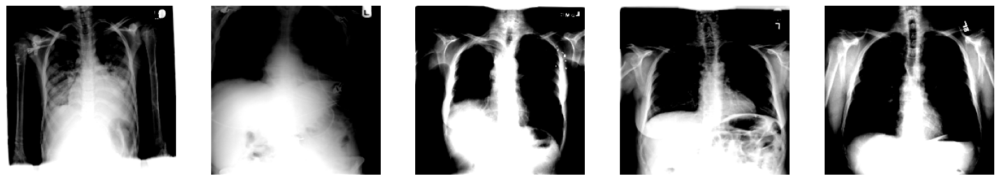

In [472]:
plt.figure(figsize=(20,20))
for i, (image, label) in enumerate(train_ds_1.take(5)):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(np.squeeze(image))
    plt.axis('off')

In [473]:
history = AN_model.fit(x = np.array(training_images), y = np.array(training_labels), epochs=7, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/7
11/11 [==============================] - 23s 2s/step - loss: 11463.7559 - accuracy: 0.0943 - val_loss: 1045.2314 - val_accuracy: 0.0784
Epoch 2/7
11/11 [==============================] - 21s 2s/step - loss: 159892.1094 - accuracy: 0.0829 - val_loss: 7836.3721 - val_accuracy: 0.0588
Epoch 3/7
11/11 [==============================] - 22s 2s/step - loss: 596869.1875 - accuracy: 0.1229 - val_loss: 15805.7070 - val_accuracy: 0.0588
Epoch 4/7
11/11 [==============================] - 22s 2s/step - loss: 1510002.6250 - accuracy: 0.1057 - val_loss: 65798.6328 - val_accuracy: 0.0588
Epoch 5/7
11/11 [==============================] - 22s 2s/step - loss: 2998403.0000 - accuracy: 0.0886 - val_loss: 510.8202 - val_accuracy: 0.0392
Epoch 6/7
11/11 [==============================] - 22s 2s/step - loss: 5318131.0000 - accuracy: 0.0886 - val_loss: 105809.3125 - val_accuracy: 0.0588
Epoch 7/7
11/11 [==============================] - 22s 2s/step - loss: 8268414.5000 - accuracy: 0.0971 - val_loss

In [474]:
np.array(training_images)

array([[[[0.34041515, 0.34041515, 0.34041515],
         [0.27346465, 0.27346465, 0.27346465],
         [0.2752553 , 0.2752553 , 0.2752553 ],
         ...,
         [0.92156863, 0.92156863, 0.92156863],
         [0.9196511 , 0.9196511 , 0.9196511 ],
         [0.92156863, 0.92156863, 0.92156863]],

        [[0.27293056, 0.27293056, 0.27293056],
         [0.26513344, 0.26513344, 0.26513344],
         [0.2690759 , 0.2690759 , 0.2690759 ],
         ...,
         [0.92069644, 0.92069644, 0.92069644],
         [0.92156863, 0.92156863, 0.92156863],
         [0.91764706, 0.91764706, 0.91764706]],

        [[0.27921742, 0.27921742, 0.27921742],
         [0.2572867 , 0.2572867 , 0.2572867 ],
         [0.25732514, 0.25732514, 0.25732514],
         ...,
         [0.920018  , 0.920018  , 0.920018  ],
         [0.91764706, 0.91764706, 0.91764706],
         [0.9146841 , 0.9146841 , 0.9146841 ]],

        ...,

        [[0.9490196 , 0.9490196 , 0.9490196 ],
         [0.9498918 , 0.9498918 , 0.9498918 ]

In [485]:
testing_preds = AN_model.predict(np.array(testing_images))

2/2 [==============================] - 1s 313ms/step


In [489]:
history.history

{'loss': [11463.755859375,
  159892.109375,
  596869.1875,
  1510002.625,
  2998403.0,
  5318131.0,
  8268414.5],
 'accuracy': [0.09428571164608002,
  0.08285713940858841,
  0.12285714596509933,
  0.10571428388357162,
  0.08857142925262451,
  0.08857142925262451,
  0.09714286029338837],
 'val_loss': [1045.2314453125,
  7836.3720703125,
  15805.70703125,
  65798.6328125,
  510.8202209472656,
  105809.3125,
  285777.34375],
 'val_accuracy': [0.0784313753247261,
  0.05882352963089943,
  0.05882352963089943,
  0.05882352963089943,
  0.03921568766236305,
  0.05882352963089943,
  0.05882352963089943]}

In [495]:
results = AN_model.evaluate(testing_images, test_labels, batch_size=2)

26/26 [==============================] - 1s 47ms/step - loss: 4569070.0000 - accuracy: 0.0588


In [522]:
#### First Experimental Model: CNN & 6 Convolutional Layers, only 1 fully-connected Layers:
exp_model_1 = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(227,227,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters = 96, kernel_size = (3,3), strides = (1,1), activation='relu', padding = 'same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(10, activation='softmax')
])

In [523]:
exp_model_1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
exp_model_1.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_110 (Conv2D)         (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization_109 (Ba  (None, 55, 55, 96)       384       
 tchNormalization)                                               
                                                                 
 max_pooling2d_58 (MaxPoolin  (None, 27, 27, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_111 (Conv2D)         (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_110 (Ba  (None, 27, 27, 256)      1024      
 tchNormalization)                                               
                                                     

In [525]:
history2 = exp_model_1.fit(x = np.array(training_images), y = np.array(training_labels), epochs=7, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/7
11/11 [==============================] - 18s 2s/step - loss: 24.4798 - accuracy: 0.1371 - val_loss: 16.4985 - val_accuracy: 0.1569
Epoch 2/7
11/11 [==============================] - 18s 2s/step - loss: 23.4217 - accuracy: 0.1343 - val_loss: 16.0594 - val_accuracy: 0.0980
Epoch 3/7
11/11 [==============================] - 18s 2s/step - loss: 24.7107 - accuracy: 0.1486 - val_loss: 16.4922 - val_accuracy: 0.1765
Epoch 4/7
11/11 [==============================] - 18s 2s/step - loss: 24.4917 - accuracy: 0.1514 - val_loss: 17.4658 - val_accuracy: 0.0980
Epoch 5/7
11/11 [==============================] - 18s 2s/step - loss: 22.8679 - accuracy: 0.1314 - val_loss: 17.5581 - val_accuracy: 0.1765
Epoch 6/7
11/11 [==============================] - 18s 2s/step - loss: 22.2732 - accuracy: 0.1257 - val_loss: 18.3076 - val_accuracy: 0.1569
Epoch 7/7
11/11 [==============================] - 18s 2s/step - loss: 22.7158 - accuracy: 0.1257 - val_loss: 24.6795 - val_accuracy: 0.1569


In [526]:
history2.history

{'loss': [24.47981834411621,
  23.42170524597168,
  24.71068000793457,
  24.49174690246582,
  22.867904663085938,
  22.273170471191406,
  22.715776443481445],
 'accuracy': [0.1371428519487381,
  0.13428571820259094,
  0.1485714316368103,
  0.15142856538295746,
  0.1314285695552826,
  0.1257142871618271,
  0.1257142871618271],
 'val_loss': [16.498451232910156,
  16.059398651123047,
  16.4921817779541,
  17.465763092041016,
  17.558082580566406,
  18.30764389038086,
  24.67946434020996],
 'val_accuracy': [0.1568627506494522,
  0.09803921729326248,
  0.1764705926179886,
  0.09803921729326248,
  0.1764705926179886,
  0.1568627506494522,
  0.1568627506494522]}

In [527]:
results = exp_model_1.evaluate(testing_images, test_labels, batch_size=1)

51/51 [==============================] - 1s 20ms/step - loss: 1876.3433 - accuracy: 0.0588


In [507]:
## Building exp_model_2, with 10 convolutional layers
exp_model_2 = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(227,227,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=576, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=864, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=864, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=576, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters = 96, kernel_size = (3,3), strides = (1,1), activation='relu', padding = 'same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation='softmax')
])

In [508]:
exp_model_2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
exp_model_2.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_97 (Conv2D)          (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization_96 (Bat  (None, 55, 55, 96)       384       
 chNormalization)                                                
                                                                 
 max_pooling2d_53 (MaxPoolin  (None, 27, 27, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_98 (Conv2D)          (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_97 (Bat  (None, 27, 27, 256)      1024      
 chNormalization)                                                
                                                     

In [509]:
history3 = exp_model_2.fit(x = np.array(training_images), y = np.array(training_labels), epochs=7, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/7
11/11 [==============================] - 70s 6s/step - loss: 5447.6709 - accuracy: 0.1029 - val_loss: 744.3722 - val_accuracy: 0.1373
Epoch 2/7
11/11 [==============================] - 69s 6s/step - loss: 75866.2344 - accuracy: 0.0800 - val_loss: 11587.4414 - val_accuracy: 0.0588
Epoch 3/7
11/11 [==============================] - 67s 6s/step - loss: 271409.5000 - accuracy: 0.0771 - val_loss: 4095.7283 - val_accuracy: 0.0588
Epoch 4/7
11/11 [==============================] - 68s 6s/step - loss: 633808.6250 - accuracy: 0.0771 - val_loss: 66324.7188 - val_accuracy: 0.0588
Epoch 5/7
11/11 [==============================] - 69s 6s/step - loss: 1252634.2500 - accuracy: 0.0800 - val_loss: 9587.0703 - val_accuracy: 0.0588
Epoch 6/7
11/11 [==============================] - 68s 6s/step - loss: 2193703.7500 - accuracy: 0.0971 - val_loss: 325.4603 - val_accuracy: 0.0392
Epoch 7/7
11/11 [==============================] - 69s 6s/step - loss: 3421083.7500 - accuracy: 0.0943 - val_loss: 4758

In [510]:
history3.history

{'loss': [5447.6708984375,
  75866.234375,
  271409.5,
  633808.625,
  1252634.25,
  2193703.75,
  3421083.75],
 'accuracy': [0.10285714268684387,
  0.07999999821186066,
  0.0771428570151329,
  0.0771428570151329,
  0.07999999821186066,
  0.09714286029338837,
  0.09428571164608002],
 'val_loss': [744.3721923828125,
  11587.44140625,
  4095.728271484375,
  66324.71875,
  9587.0703125,
  325.4603271484375,
  47587.421875],
 'val_accuracy': [0.13725490868091583,
  0.05882352963089943,
  0.05882352963089943,
  0.05882352963089943,
  0.05882352963089943,
  0.03921568766236305,
  0.05882352963089943]}

In [514]:
results = exp_model_2.evaluate(testing_images, test_labels, batch_size=1)

51/51 [==============================] - 4s 75ms/step - loss: 9141996.0000 - accuracy: 0.0588


In [515]:
### Experimental Model 3, with only the 3 simplest convolutional layers:
exp_model_3 = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(227,227,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters = 96, kernel_size = (3,3), strides = (1,1), activation='relu', padding = 'same'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(10, activation='softmax')
])

In [517]:
exp_model_3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
exp_model_3.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_107 (Conv2D)         (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization_106 (Ba  (None, 55, 55, 96)       384       
 tchNormalization)                                               
                                                                 
 max_pooling2d_56 (MaxPoolin  (None, 27, 27, 96)       0         
 g2D)                                                            
                                                                 
 conv2d_108 (Conv2D)         (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_107 (Ba  (None, 27, 27, 256)      1024      
 tchNormalization)                                               
                                                     

In [518]:
history4 = exp_model_3.fit(x = np.array(training_images), y = np.array(training_labels), epochs=7, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/7
11/11 [==============================] - 20s 2s/step - loss: 10605.4092 - accuracy: 0.1171 - val_loss: 44.2109 - val_accuracy: 0.0588
Epoch 2/7
11/11 [==============================] - 19s 2s/step - loss: 125044.4766 - accuracy: 0.0943 - val_loss: 224.2617 - val_accuracy: 0.0588
Epoch 3/7
11/11 [==============================] - 18s 2s/step - loss: 531677.4375 - accuracy: 0.0886 - val_loss: 491.8702 - val_accuracy: 0.0588
Epoch 4/7
11/11 [==============================] - 18s 2s/step - loss: 1390712.3750 - accuracy: 0.0943 - val_loss: 521.6980 - val_accuracy: 0.0588
Epoch 5/7
11/11 [==============================] - 18s 2s/step - loss: 2962215.7500 - accuracy: 0.0886 - val_loss: 318.6366 - val_accuracy: 0.0980
Epoch 6/7
11/11 [==============================] - 20s 2s/step - loss: 5316303.5000 - accuracy: 0.0800 - val_loss: 698.3626 - val_accuracy: 0.0784
Epoch 7/7
11/11 [==============================] - 19s 2s/step - loss: 8876903.0000 - accuracy: 0.1057 - val_loss: 1029.856

In [520]:
history4.history

{'loss': [10605.4091796875,
  125044.4765625,
  531677.4375,
  1390712.375,
  2962215.75,
  5316303.5,
  8876903.0],
 'accuracy': [0.11714285612106323,
  0.09428571164608002,
  0.08857142925262451,
  0.09428571164608002,
  0.08857142925262451,
  0.07999999821186066,
  0.10571428388357162],
 'val_loss': [44.2109375,
  224.26171875,
  491.8702087402344,
  521.697998046875,
  318.6366271972656,
  698.3626098632812,
  1029.8564453125],
 'val_accuracy': [0.05882352963089943,
  0.05882352963089943,
  0.05882352963089943,
  0.05882352963089943,
  0.09803921729326248,
  0.0784313753247261,
  0.0784313753247261]}

In [521]:
results = exp_model_3.evaluate(testing_images, test_labels, batch_size=1)

51/51 [==============================] - 2s 27ms/step - loss: 1297252.0000 - accuracy: 0.0588


In [528]:
history = AN_model.fit(x = np.array(training_images), y = np.array(training_labels), epochs=50, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/50
11/11 [==============================] - 25s 2s/step - loss: 12661125.0000 - accuracy: 0.0743 - val_loss: 439115.1875 - val_accuracy: 0.0784
Epoch 2/50
11/11 [==============================] - 23s 2s/step - loss: 18136212.0000 - accuracy: 0.1000 - val_loss: 1241892.1250 - val_accuracy: 0.0588
Epoch 3/50
11/11 [==============================] - 22s 2s/step - loss: 25450542.0000 - accuracy: 0.1114 - val_loss: 2368446.2500 - val_accuracy: 0.0588
Epoch 4/50
11/11 [==============================] - 22s 2s/step - loss: 33119326.0000 - accuracy: 0.0914 - val_loss: 1286636.7500 - val_accuracy: 0.0588
Epoch 5/50
11/11 [==============================] - 23s 2s/step - loss: 42022056.0000 - accuracy: 0.1057 - val_loss: 7151229.5000 - val_accuracy: 0.0588
Epoch 6/50
11/11 [==============================] - 23s 2s/step - loss: 55303120.0000 - accuracy: 0.0829 - val_loss: 5727111.5000 - val_accuracy: 0.0784
Epoch 7/50
11/11 [==============================] - 22s 2s/step - loss: 69727064.00

In [529]:
history2 = exp_model_1.fit(x = np.array(training_images), y = np.array(training_labels), epochs=50, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/50
11/11 [==============================] - 18s 2s/step - loss: 22.7126 - accuracy: 0.1486 - val_loss: 18.8600 - val_accuracy: 0.1176
Epoch 2/50
11/11 [==============================] - 18s 2s/step - loss: 21.7520 - accuracy: 0.1286 - val_loss: 21.6786 - val_accuracy: 0.1373
Epoch 3/50
11/11 [==============================] - 17s 2s/step - loss: 21.2101 - accuracy: 0.1829 - val_loss: 19.6922 - val_accuracy: 0.1569
Epoch 4/50
11/11 [==============================] - 17s 2s/step - loss: 22.2753 - accuracy: 0.1257 - val_loss: 20.7439 - val_accuracy: 0.1373
Epoch 5/50
11/11 [==============================] - 17s 2s/step - loss: 21.8895 - accuracy: 0.1629 - val_loss: 20.0507 - val_accuracy: 0.1765
Epoch 6/50
11/11 [==============================] - 17s 2s/step - loss: 21.8377 - accuracy: 0.1171 - val_loss: 23.7422 - val_accuracy: 0.1569
Epoch 7/50
11/11 [==============================] - 17s 2s/step - loss: 22.3368 - accuracy: 0.1171 - val_loss: 25.0328 - val_accuracy: 0.1765
Epoch 

In [530]:
history3 = exp_model_2.fit(x = np.array(training_images), y = np.array(training_labels), epochs=50, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/50
11/11 [==============================] - 72s 6s/step - loss: 4780565.0000 - accuracy: 0.0886 - val_loss: 332349.2188 - val_accuracy: 0.0588
Epoch 2/50
11/11 [==============================] - 70s 6s/step - loss: 6207045.5000 - accuracy: 0.0886 - val_loss: 659742.4375 - val_accuracy: 0.0588
Epoch 3/50
11/11 [==============================] - 66s 6s/step - loss: 7405050.0000 - accuracy: 0.1057 - val_loss: 125044.3750 - val_accuracy: 0.0784
Epoch 4/50
11/11 [==============================] - 67s 6s/step - loss: 8820907.0000 - accuracy: 0.0943 - val_loss: 1795617.6250 - val_accuracy: 0.0588
Epoch 5/50
11/11 [==============================] - 67s 6s/step - loss: 10766817.0000 - accuracy: 0.0743 - val_loss: 910312.3125 - val_accuracy: 0.0588
Epoch 6/50
11/11 [==============================] - 67s 6s/step - loss: 12723962.0000 - accuracy: 0.0971 - val_loss: 1281065.6250 - val_accuracy: 0.0784
Epoch 7/50
11/11 [==============================] - 67s 6s/step - loss: 14895901.0000 - ac

In [531]:
history4 =exp_model_3.fit(x = np.array(training_images), y = np.array(training_labels), epochs=50, verbose = 1,
                    validation_data=(np.array(validation_images), np.array(validation_labels)), use_multiprocessing = True,
                      workers = 2)

Epoch 1/50
11/11 [==============================] - 20s 2s/step - loss: 13916186.0000 - accuracy: 0.1086 - val_loss: 842.1232 - val_accuracy: 0.0784
Epoch 2/50
11/11 [==============================] - 19s 2s/step - loss: 21081112.0000 - accuracy: 0.0886 - val_loss: 268.3130 - val_accuracy: 0.0784
Epoch 3/50
11/11 [==============================] - 18s 2s/step - loss: 29430872.0000 - accuracy: 0.1029 - val_loss: 134084.4844 - val_accuracy: 0.0784
Epoch 4/50
11/11 [==============================] - 17s 2s/step - loss: 40558524.0000 - accuracy: 0.1371 - val_loss: 423167.0625 - val_accuracy: 0.0392
Epoch 5/50
11/11 [==============================] - 18s 2s/step - loss: 53128036.0000 - accuracy: 0.0829 - val_loss: 1133235.8750 - val_accuracy: 0.0588
Epoch 6/50
11/11 [==============================] - 19s 2s/step - loss: 68194832.0000 - accuracy: 0.1000 - val_loss: 3747584.2500 - val_accuracy: 0.0392
Epoch 7/50
11/11 [==============================] - 19s 2s/step - loss: 86711040.0000 - accu

In [532]:
print(AN_model.evaluate(testing_images, test_labels, batch_size=1))
print(exp_model_1.evaluate(testing_images, test_labels, batch_size=1))
print(exp_model_2.evaluate(testing_images, test_labels, batch_size=1))
print(exp_model_3.evaluate(testing_images, test_labels, batch_size=1))

51/51 [==============================] - 2s 29ms/step - loss: 34291648512.0000 - accuracy: 0.0784
[34291648512.0, 0.0784313753247261]
51/51 [==============================] - 1s 20ms/step - loss: 1135.3446 - accuracy: 0.0588
[1135.3446044921875, 0.05882352963089943]
51/51 [==============================] - 4s 74ms/step - loss: 45470528.0000 - accuracy: 0.0588
[45470528.0, 0.05882352963089943]
51/51 [==============================] - 1s 26ms/step - loss: 22160674816.0000 - accuracy: 0.0588
[22160674816.0, 0.05882352963089943]
